In [75]:
#from ema_workbench.connectors.vensim import VensimModel
from ema_workbench.analysis.plotting import lines, Density, kde_over_time
from ema_workbench.analysis import pairs_plotting, prim, feature_scoring, dimensional_stacking, regional_sa, get_ex_feature_scores, RuleInductionType, multiple_densities
from numpy.lib import recfunctions as rf

from ema_workbench.analysis.plotting import kde_over_time

import ema_workbench.analysis.cart as cart

import math
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

from ema_workbench import (
    Model,
    RealParameter,
    Constant,
    ScalarOutcome,
    TimeSeriesOutcome,
    ema_logging,
    perform_experiments,
    MultiprocessingEvaluator,
    CategoricalParameter
)

# Check Pandas version!!
Please make sure that the current pandas version you are running is of the form 1.x.x instead of 2.x.x. Since a functionality used in the prim algorithm is not able to work with pandas version 2.

In [38]:
pd.__version__

'1.4.4'

In [8]:
wd =  r'VensimModels'
model = VensimModel("main", wd=wd, model_file=r'Main_V13.1.vpmx')

model.uncertainties = [RealParameter("annual change in preference of workers", 0.0, 0.1),
    RealParameter("annual change in FTE per worker", 0.0, 0.1),
    RealParameter("labour input coefficient", -0.5, 1.5),
    RealParameter("elasticity of productivity to investment growth", 0.4, 0.57),
    RealParameter("threshold number of years long unemployment", 1, 3),
    RealParameter("increase of skill multiplier", 1.05, 1.3),
    RealParameter("elasticity of hiring on expected earnings", 0, 1),
    RealParameter("hiring time", 1, 5),
    RealParameter("firing time", 2, 15), 
    RealParameter(r"time per edu level[mbo]", 4, 6),
    RealParameter(r"time per edu level[hbo]", 4, 7),
    RealParameter(r"time per edu level[wo]", 4.5, 8),
    RealParameter(r"fraction that prematurely leaves edu level[mbo]", 0, 0.1),
    RealParameter(r"fraction that prematurely leaves edu level[hbo]", 0, 0.1),
    RealParameter(r"fraction that prematurely leaves edu level[wo]", 0, 0.1),
    RealParameter("annual change in reservation wage", 0.01, 0.1),
    RealParameter("exogenous fractional increase in average wage", 0, 0.1),
    CategoricalParameter("SWITCH GDP growth scenario", (0, 1, 2)),
    CategoricalParameter("SWITCH immigration scenarios", (0, 1, 2, 3)),
    CategoricalParameter("SWITCH technological development scenario", (0, 1, 2, 3))
    
                      ]


model.outcomes = [TimeSeriesOutcome('unemployment rate'),
                  TimeSeriesOutcome('net FTE scarcity'),
                  TimeSeriesOutcome('GDP'),
                  TimeSeriesOutcome("total FTE's demanded"),
                  TimeSeriesOutcome('total average FTE scarcity'),
                  TimeSeriesOutcome('FTE scarcity for low edu'),
                  TimeSeriesOutcome('FTE scarcity for mid edu'),
                  TimeSeriesOutcome('FTE scarcity for high edu'),
                  TimeSeriesOutcome('total hiring'),
                  TimeSeriesOutcome('total firing'),
                  TimeSeriesOutcome('total persons employed'),
                  TimeSeriesOutcome('total persons unemployed'),
                  TimeSeriesOutcome('current percentage mbo attainment'),
                  TimeSeriesOutcome('current percentage hbo attainment'),
                  TimeSeriesOutcome('current percentage wo attainment'),
                  TimeSeriesOutcome(r'percentual change in fractions educational attainment[mbo]'),
                  TimeSeriesOutcome(r'percentual change in fractions educational attainment[hbo]'),
                  TimeSeriesOutcome(r'percentual change in fractions educational attainment[wo]')
                 ]

model.levers = [
    CategoricalParameter("SWITCH increase FTE per worker", (0,1)),
    RealParameter("starting age for targeting fte per worker increase", 40, 55),
    RealParameter("starting year increase FTE per worker policy", 1, 20),
    CategoricalParameter("SWITCH secondary school level flow", (0, 1, 2, 3)),
    RealParameter(r"change inflow high ed students[hbo]", 0.8, 1.2),
    RealParameter(r"change inflow high ed students[wo]", 0.8, 1.2),
    RealParameter('policy increase in retirement age', 0, 0.75),
    RealParameter("average percentual yearly increase in minimum wage", 0, 0.1)
]


ema_logging.log_to_stderr(level=ema_logging.INFO)
 
#results = perform_experiments(model, 10, policies = 5)

with MultiprocessingEvaluator(model) as evaluator:
    results = evaluator.perform_experiments(1000, policies = 15)

# from ema_workbench import save_results
# save_results(results, './postGL runs.tar.gz')


[MainProcess/INFO] pool started with 4 workers
[MainProcess/INFO] performing 1000 scenarios * 15 policies * 1 model(s) = 15000 experiments
100%|██████████████████████████████████| 15000/15000 [8:33:15<00:00,  2.05s/it]
[MainProcess/INFO] experiments finished
[MainProcess/INFO] terminating pool
C:\Users\Gebruiker\anaconda3\lib\site-packages\ema_workbench\em_framework\outcomes.py:515: UserWarning: still to be tested!!
  warnings.warn("still to be tested!!")
[MainProcess/INFO] results saved successfully to C:\Users\Gebruiker\thesis\postGL runs.tar.gz


# Creating extra columns with categorical variables

In [78]:
pd.set_option('display.max_columns', None)
experiments

,SWITCH GDP growth scenario,SWITCH immigration scenarios,SWITCH technological development scenario,annual change in FTE per worker,annual change in preference of workers,annual change in reservation wage,elasticity of hiring on expected earnings,elasticity of productivity to investment growth,exogenous fractional increase in average wage,firing time,fraction that prematurely leaves edu level[hbo],fraction that prematurely leaves edu level[mbo],fraction that prematurely leaves edu level[wo],hiring time,increase of skill multiplier,labour productivity coefficient,threshold number of years long unemployment,time per edu level[hbo],time per edu level[mbo],time per edu level[wo],SWITCH increase FTE per worker,SWITCH secondary school level flow,average percentual yearly increase in minimum wage,change inflow high ed students[hbo],change inflow high ed students[wo],policy increase in retirement age,starting age for targeting fte per worker increase,starting year increase FTE per worker policy,scenario,policy,model,hiring_cat
0,1,0,0,0.068804,0.089597,0.028012,0.985339,0.036669,0.000487,12.858099,0.027679,0.093630,0.057204,2.823302,1.140784,0.592915,2.136133,6.204819,4.632136,5.058649,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,15,0,main,1
1,1,0,3,0.031124,0.033689,0.077075,0.698796,0.122962,0.052567,10.591035,0.045331,0.027721,0.086798,3.085779,1.168782,1.051958,1.946771,4.755653,5.007816,6.003129,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,16,0,main,1
2,1,3,1,0.033794,0.024676,0.091845,0.299902,0.933233,0.050520,3.070746,0.096212,0.042596,0.045359,2.678970,1.059271,0.344643,2.243630,6.435551,5.964928,5.868515,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,17,0,main,1
3,1,0,2,0.043607,0.064831,0.038756,0.938386,0.714204,0.075382,9.812669,0.002015,0.070510,0.002323,4.128399,1.285461,-0.366305,1.452612,5.334469,5.358325,6.871886,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,18,0,main,2
4,1,0,3,0.058885,0.087753,0.084084,0.671662,0.199379,0.049219,8.555989,0.011399,0.048554,0.026367,1.782921,1.100904,0.957431,2.719283,6.112115,5.938321,6.728890,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,19,0,main,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,1,1,1,0.027325,0.051320,0.089031,0.919589,0.075645,0.007412,13.434468,0.084088,0.033458,0.039752,4.889801,1.197144,0.823547,2.674792,5.393051,4.192572,5.952527,0,3,0.063727,1.057343,1.024169,0.384054,40.282196,3.729261,1010,14,main,2
14996,1,1,0,0.098759,0.031331,0.017239,0.388892,0.526920,0.095574,9.551295,0.001609,0.040451,0.092262,3.616448,1.129945,1.376546,1.926671,4.758642,5.961111,6.316975,0,3,0.063727,1.057343,1.024169,0.384054,40.282196,3.729261,1011,14,main,1
14997,2,0,2,0.039999,0.004079,0.059450,0.111135,0.558424,0.084816,3.146101,0.053511,0.054854,0.018358,1.546437,1.142997,0.054868,2.715889,5.160867,5.909721,5.031950,0,3,0.063727,1.057343,1.024169,0.384054,40.282196,3.729261,1012,14,main,0
14998,0,0,1,0.042120,0.070416,0.044377,0.414020,0.320280,0.076451,12.644291,0.049695,0.098511,0.010492,2.402415,1.052251,0.948165,2.420345,6.503060,5.314905,6.851063,0,3,0.063727,1.057343,1.024169,0.384054,40.282196,3.729261,1013,14,main,1


# The Analysis

In [147]:
from ema_workbench import load_results
results = load_results('./postGL_v3 runs.tar.gz')

In [148]:
experiments, outcomes = results

# Feature Scoring

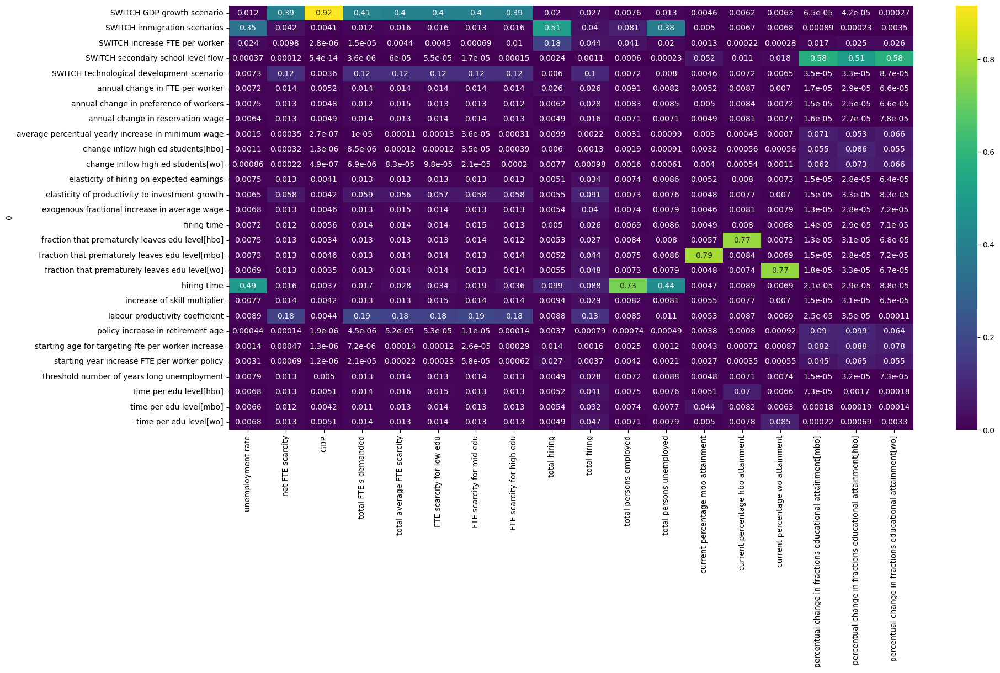

In [47]:
x = experiments.drop('policy', axis=1)
end_states = {k:v[:,-1] for k,v in outcomes.items()}
end_states.pop('TIME', None)

fs = feature_scoring.get_feature_scores_all(x, end_states)

fig, ax = plt.subplots(figsize=(20,10))         # Sample figsize in inches
sns.heatmap(fs, cmap="viridis", annot=True, ax=ax)
plt.show()

In [143]:
experiments

,SWITCH GDP growth scenario,SWITCH immigration scenarios,SWITCH technological development scenario,annual change in FTE per worker,annual change in preference of workers,annual change in reservation wage,elasticity of hiring on expected earnings,elasticity of productivity to investment growth,exogenous fractional increase in average wage,firing time,fraction that prematurely leaves edu level[hbo],fraction that prematurely leaves edu level[mbo],fraction that prematurely leaves edu level[wo],hiring time,increase of skill multiplier,labour productivity coefficient,threshold number of years long unemployment,time per edu level[hbo],time per edu level[mbo],time per edu level[wo],SWITCH increase FTE per worker,SWITCH secondary school level flow,average percentual yearly increase in minimum wage,change inflow high ed students[hbo],change inflow high ed students[wo],policy increase in retirement age,starting age for targeting fte per worker increase,starting year increase FTE per worker policy,policy,model,hiring_cat,retirement_pol_cat
0,1,0,0,0.068804,0.089597,0.028012,0.985339,0.036669,0.000487,12.858099,0.027679,0.093630,0.057204,2.823302,1.140784,0.592915,2.136133,6.204819,4.632136,5.058649,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,0,main,1,1
1,1,0,3,0.031124,0.033689,0.077075,0.698796,0.122962,0.052567,10.591035,0.045331,0.027721,0.086798,3.085779,1.168782,1.051958,1.946771,4.755653,5.007816,6.003129,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,0,main,1,1
2,1,3,1,0.033794,0.024676,0.091845,0.299902,0.933233,0.050520,3.070746,0.096212,0.042596,0.045359,2.678970,1.059271,0.344643,2.243630,6.435551,5.964928,5.868515,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,0,main,1,1
3,1,0,2,0.043607,0.064831,0.038756,0.938386,0.714204,0.075382,9.812669,0.002015,0.070510,0.002323,4.128399,1.285461,-0.366305,1.452612,5.334469,5.358325,6.871886,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,0,main,2,1
4,1,0,3,0.058885,0.087753,0.084084,0.671662,0.199379,0.049219,8.555989,0.011399,0.048554,0.026367,1.782921,1.100904,0.957431,2.719283,6.112115,5.938321,6.728890,0,1,0.013198,1.197053,0.914557,0.423836,42.744530,4.807961,0,main,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,1,1,1,0.027325,0.051320,0.089031,0.919589,0.075645,0.007412,13.434468,0.084088,0.033458,0.039752,4.889801,1.197144,0.823547,2.674792,5.393051,4.192572,5.952527,0,3,0.063727,1.057343,1.024169,0.384054,40.282196,3.729261,14,main,2,1
14996,1,1,0,0.098759,0.031331,0.017239,0.388892,0.526920,0.095574,9.551295,0.001609,0.040451,0.092262,3.616448,1.129945,1.376546,1.926671,4.758642,5.961111,6.316975,0,3,0.063727,1.057343,1.024169,0.384054,40.282196,3.729261,14,main,1,1
14997,2,0,2,0.039999,0.004079,0.059450,0.111135,0.558424,0.084816,3.146101,0.053511,0.054854,0.018358,1.546437,1.142997,0.054868,2.715889,5.160867,5.909721,5.031950,0,3,0.063727,1.057343,1.024169,0.384054,40.282196,3.729261,14,main,0,1
14998,0,0,1,0.042120,0.070416,0.044377,0.414020,0.320280,0.076451,12.644291,0.049695,0.098511,0.010492,2.402415,1.052251,0.948165,2.420345,6.503060,5.314905,6.851063,0,3,0.063727,1.057343,1.024169,0.384054,40.282196,3.729261,14,main,1,1


/var/folders/g2/dx64r05j44x92cwyb13qp2rm0000gp/T/ipykernel_4318/1130819409.py:18: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  all_scores = all_scores.loc[top_5, :]


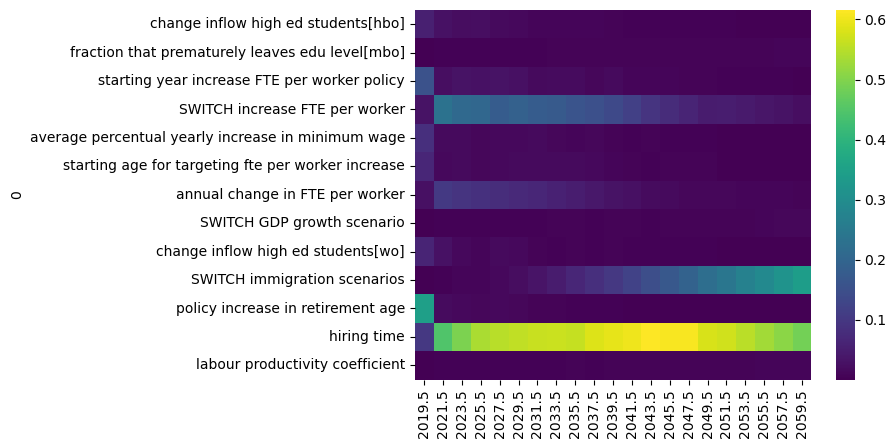

In [149]:
y = outcomes["unemployment rate"]
x = experiments
x = x.drop(["model", "policy"], axis=1)
all_scores = []

# we only want to show those uncertainties that are in the top 5
# most sensitive parameters at any time step
top_5 = set()
for i in range(2, y.shape[1], 8):
    data = y[:, i]
    scores = get_ex_feature_scores(x, data, mode=RuleInductionType.REGRESSION)[0]
    # add the top five for this time step to the set of top5s
    top_5 |= set(scores.nlargest(5, 1).index.values)
    scores = scores.rename(columns={1: outcomes["TIME"][0, i]})
    all_scores.append(scores)

all_scores = pd.concat(all_scores, axis=1, sort=False)
all_scores = all_scores.loc[top_5, :]

fig, ax = plt.subplots()
sns.heatmap(all_scores, ax=ax, cmap="viridis")
plt.show()

/var/folders/g2/dx64r05j44x92cwyb13qp2rm0000gp/T/ipykernel_4318/279961587.py:18: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  all_scores = all_scores.loc[top_5, :]


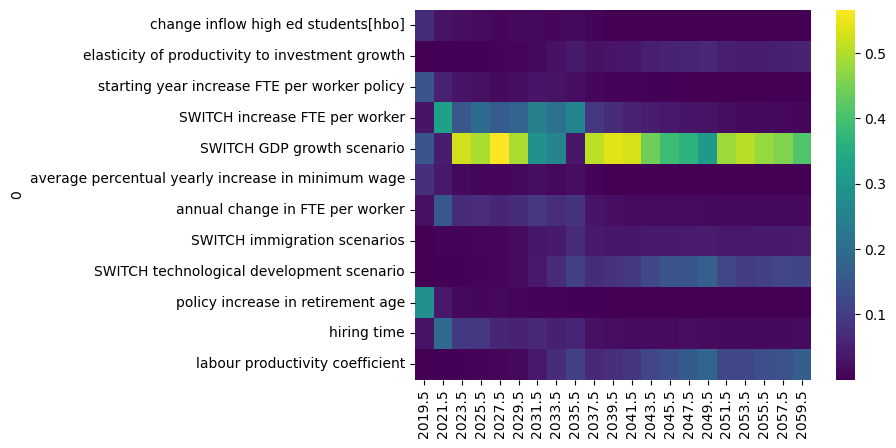

In [150]:
y = outcomes["net FTE scarcity"]
x = experiments
x = x.drop(["model", "policy"], axis=1)
all_scores = []

# we only want to show those uncertainties that are in the top 5
# most sensitive parameters at any time step
top_5 = set()
for i in range(2, y.shape[1], 8):
    data = y[:, i]
    scores = get_ex_feature_scores(x, data, mode=RuleInductionType.REGRESSION)[0]
    # add the top five for this time step to the set of top5s
    top_5 |= set(scores.nlargest(5, 1).index.values)
    scores = scores.rename(columns={1: outcomes["TIME"][0, i]})
    all_scores.append(scores)

all_scores = pd.concat(all_scores, axis=1, sort=False)
all_scores = all_scores.loc[top_5, :]

fig, ax = plt.subplots()
sns.heatmap(all_scores, ax=ax, cmap="viridis")
plt.show()

### Increase retirement age categorisation

In [145]:
# Defines the ranges and corresponding labels for the categorical values
ranges = [0, 0.25, 0.5, 0.75]
labels = [0, 1, 2]

#create the new categorical column
experiments['retirement_pol_cat'] = pd.cut(experiments['policy increase in retirement age'], bins=ranges, labels=labels, include_lowest=True)


### Hiring time categorisation

In [156]:
# Defines the ranges and corresponding labels for the categorical values
ranges = [1, 2, 4, 5]
labels = [0, 1, 2]

#create the new categorical column
experiments['hiring_cat'] = pd.cut(experiments['hiring time'], bins=ranges, labels=labels, include_lowest=True)


### Labour coefficient categorisation

In [157]:
# Defines the ranges and corresponding labels for the categorical values
ranges = [-0.5, 0, 1, 1.5]
labels = [0, 1, 2]

#create the new categorical column
experiments['labour_coeff_cat'] = pd.cut(experiments['labour productivity coefficient'], bins=ranges, labels=labels, include_lowest=True)


# KDE over scenarios

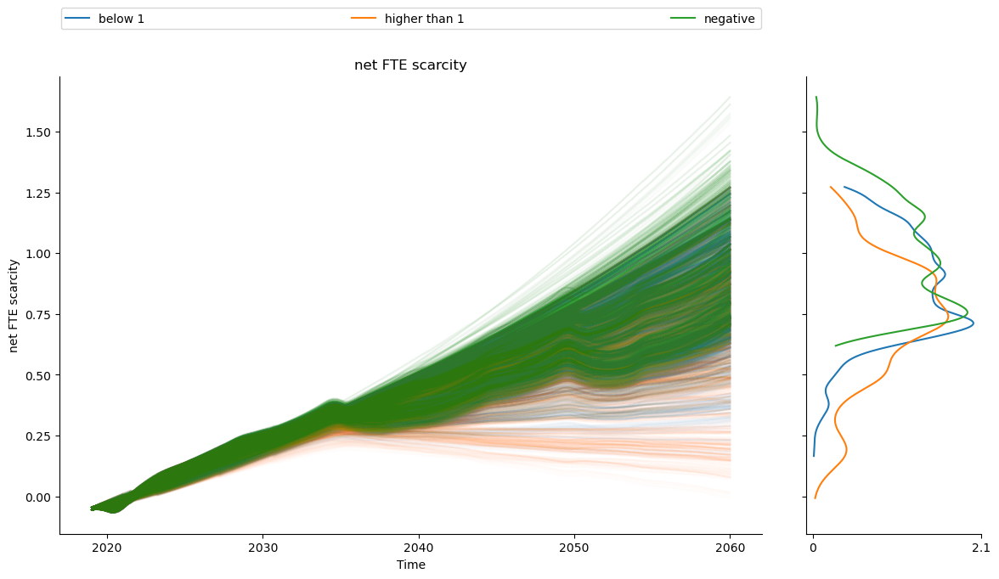

In [158]:
lines(experiments, outcomes, outcomes_to_show=['net FTE scarcity'],
               group_by= "labour_coeff_cat", 
               grouping_specifiers = {'negative': 0, 'below 1' : 1, 'higher than 1' : 2}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

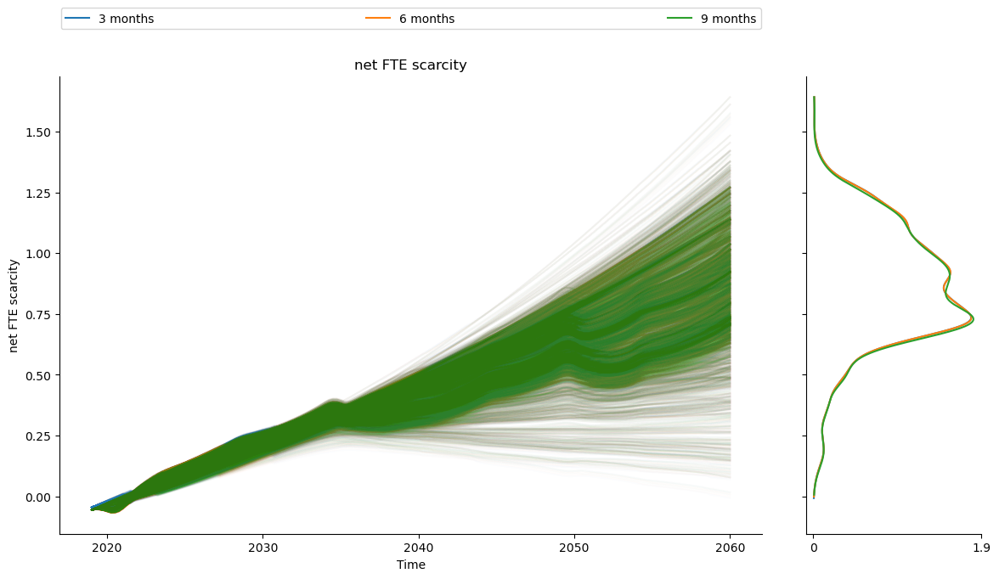

In [81]:
lines(experiments, outcomes, outcomes_to_show=['net FTE scarcity'],
               group_by= "retirement_pol_cat", 
               grouping_specifiers = {'3 months': 0, '6 months' : 1, '9 months' : 2}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

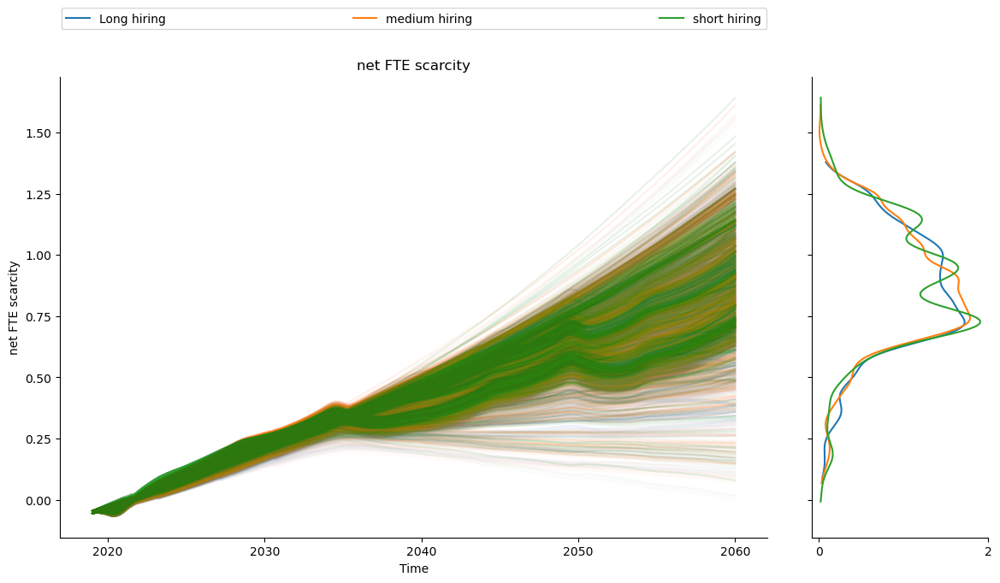

In [72]:
lines(experiments, outcomes, outcomes_to_show=['net FTE scarcity'],
               group_by= "hiring_cat", 
               grouping_specifiers = {'short hiring': 0, 'medium hiring' : 1, 'Long hiring' : 2}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

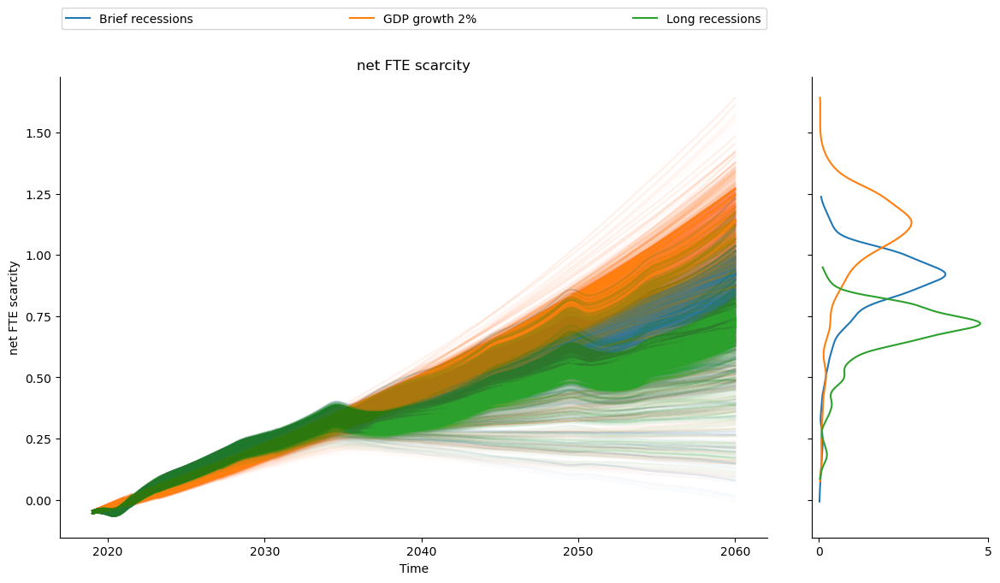

In [41]:
lines(experiments, outcomes, outcomes_to_show=['net FTE scarcity'],
               group_by= "SWITCH GDP growth scenario", 
               grouping_specifiers = {'GDP growth 2%': 0, 'Brief recessions' : 1, 'Long recessions' : 2}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

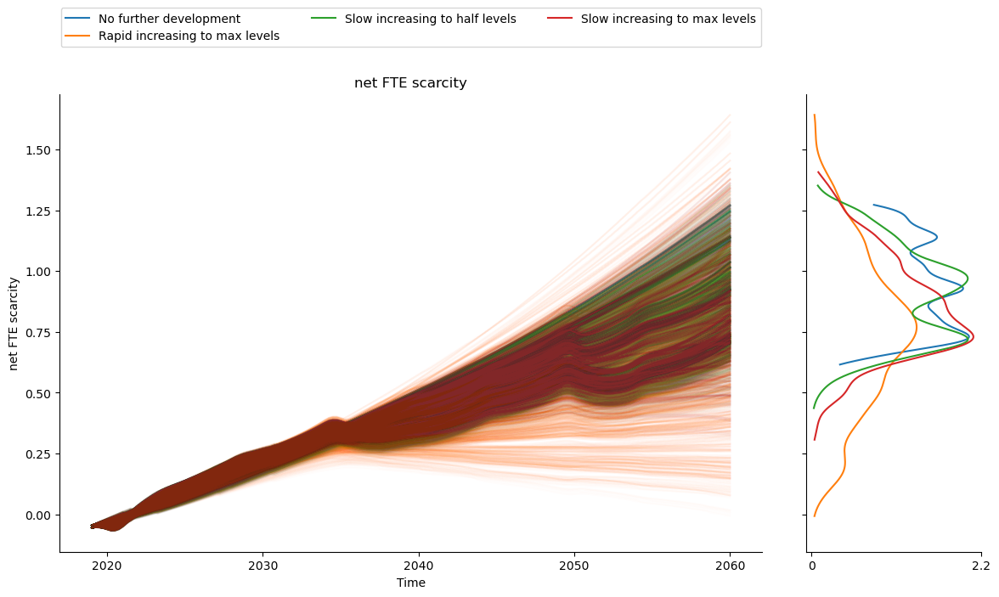

In [42]:
lines(experiments, outcomes, outcomes_to_show=['net FTE scarcity'],
               group_by= "SWITCH technological development scenario", 
               grouping_specifiers = {'No further development': 0, 'Slow increasing to max levels' : 1,
                                      'Slow increasing to half levels' : 2, 'Rapid increasing to max levels' : 3}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

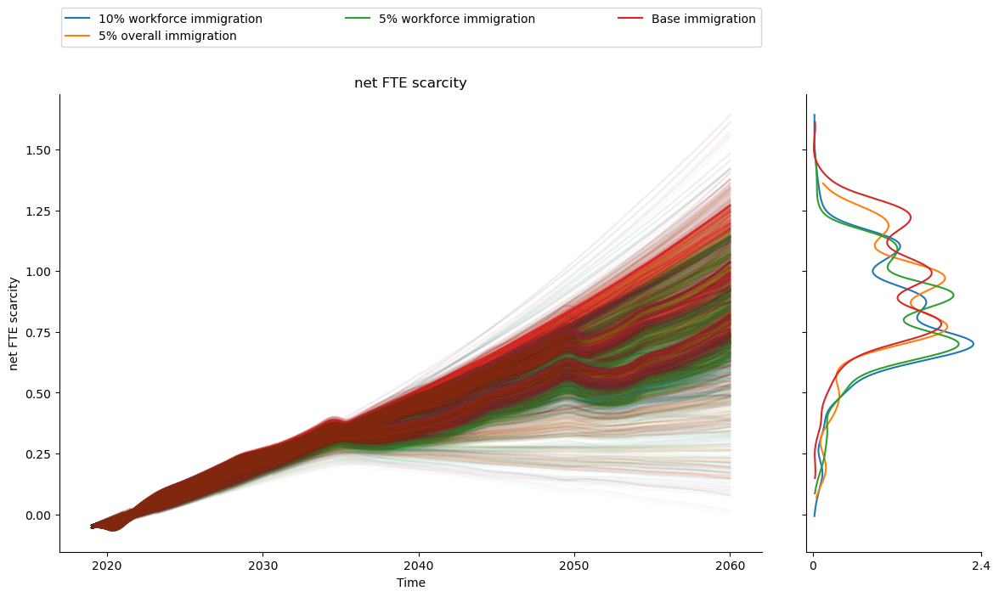

In [43]:
lines(experiments, outcomes, outcomes_to_show=['net FTE scarcity'],
               group_by= "SWITCH immigration scenarios", 
               grouping_specifiers = {'Base immigration': 0, '5% overall immigration' : 1,
                                      '5% workforce immigration' : 2, '10% workforce immigration' : 3}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

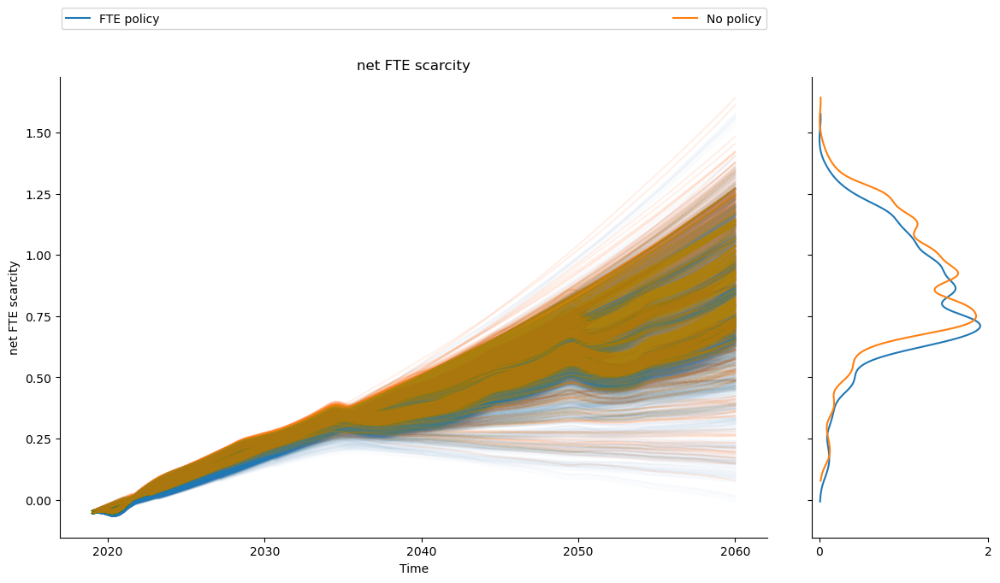

In [50]:
lines(experiments, outcomes, outcomes_to_show=['net FTE scarcity'],
               group_by= "SWITCH increase FTE per worker", 
               grouping_specifiers = {'No policy': 0, 'FTE policy' : 1}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

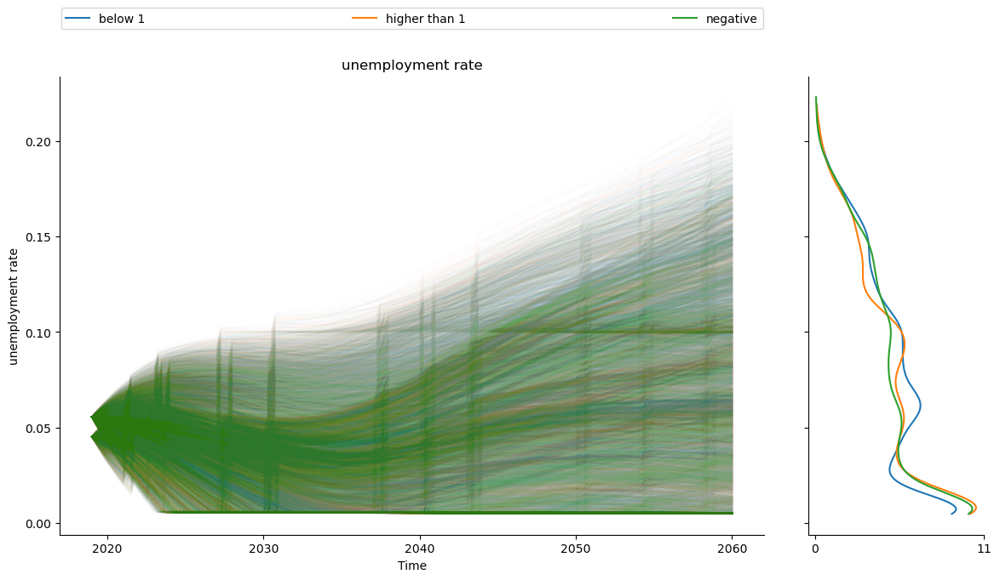

In [159]:
lines(experiments, outcomes, outcomes_to_show=['unemployment rate'],
               group_by= "labour_coeff_cat", 
               grouping_specifiers = {'negative': 0, 'below 1' : 1, 'higher than 1' : 2}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

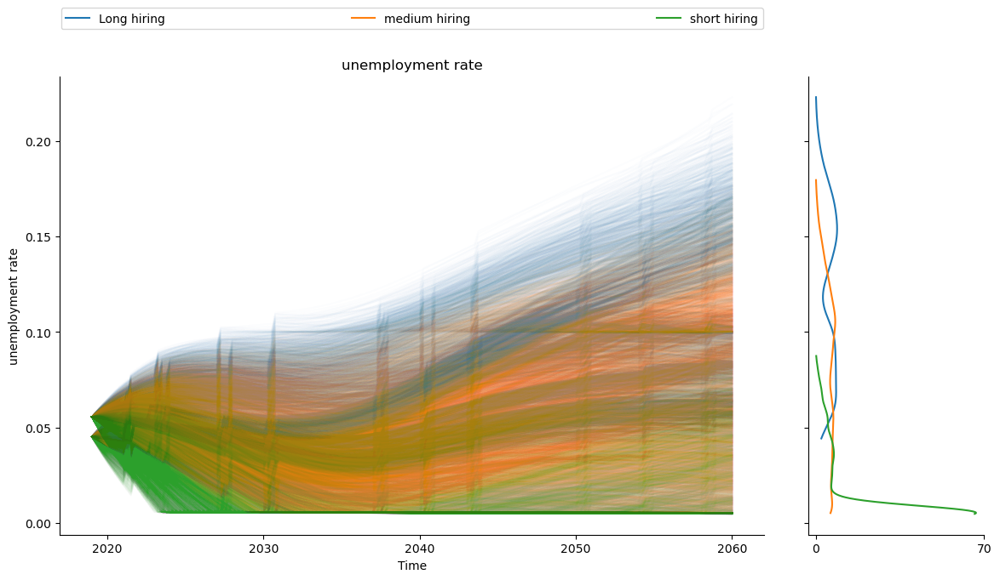

In [83]:
lines(experiments, outcomes, outcomes_to_show=['unemployment rate'],
               group_by= "hiring_cat", 
               grouping_specifiers = {'short hiring': 0, 'medium hiring' : 1, 'Long hiring' : 2}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

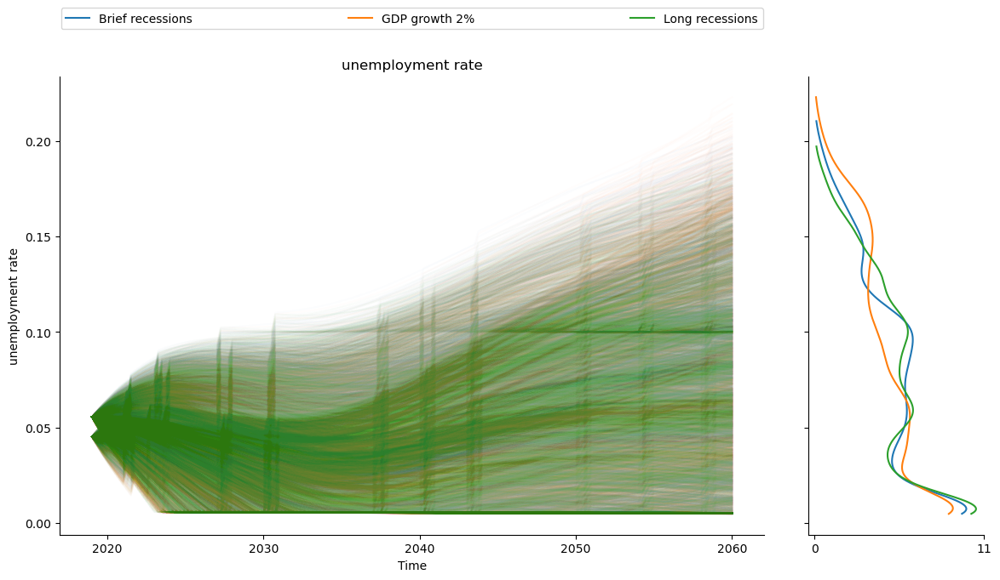

In [44]:
lines(experiments, outcomes, outcomes_to_show=['unemployment rate'],
               group_by= "SWITCH GDP growth scenario", 
               grouping_specifiers = {'GDP growth 2%': 0, 'Brief recessions' : 1, 'Long recessions' : 2}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

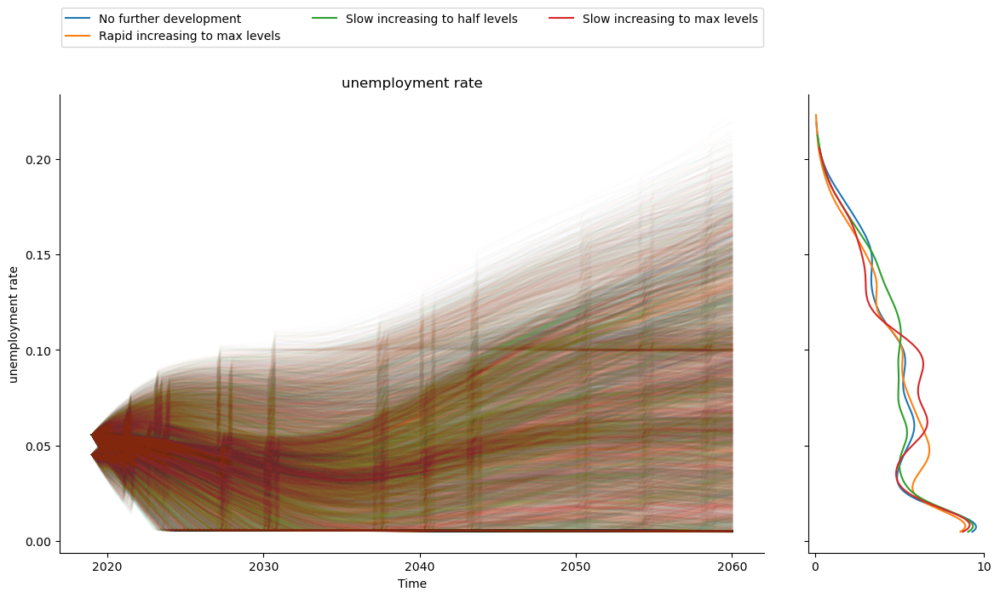

In [45]:
lines(experiments, outcomes, outcomes_to_show=['unemployment rate'],
               group_by= "SWITCH technological development scenario", 
               grouping_specifiers = {'No further development': 0, 'Slow increasing to max levels' : 1,
                                      'Slow increasing to half levels' : 2, 'Rapid increasing to max levels' : 3}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

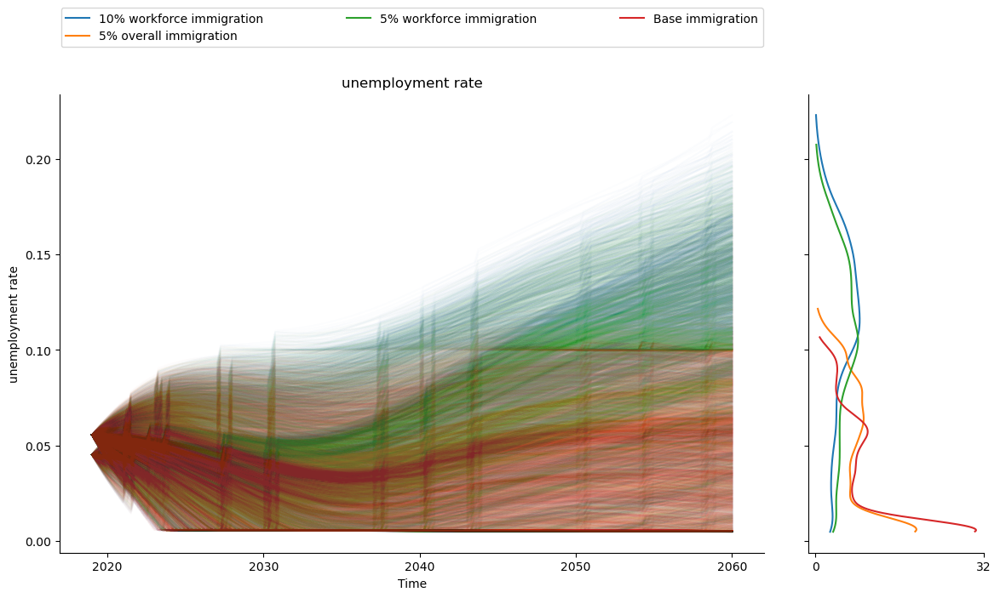

In [46]:
lines(experiments, outcomes, outcomes_to_show=['unemployment rate'],
               group_by= "SWITCH immigration scenarios", 
               grouping_specifiers = {'Base immigration': 0, '5% overall immigration' : 1,
                                      '5% workforce immigration' : 2, '10% workforce immigration' : 3}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

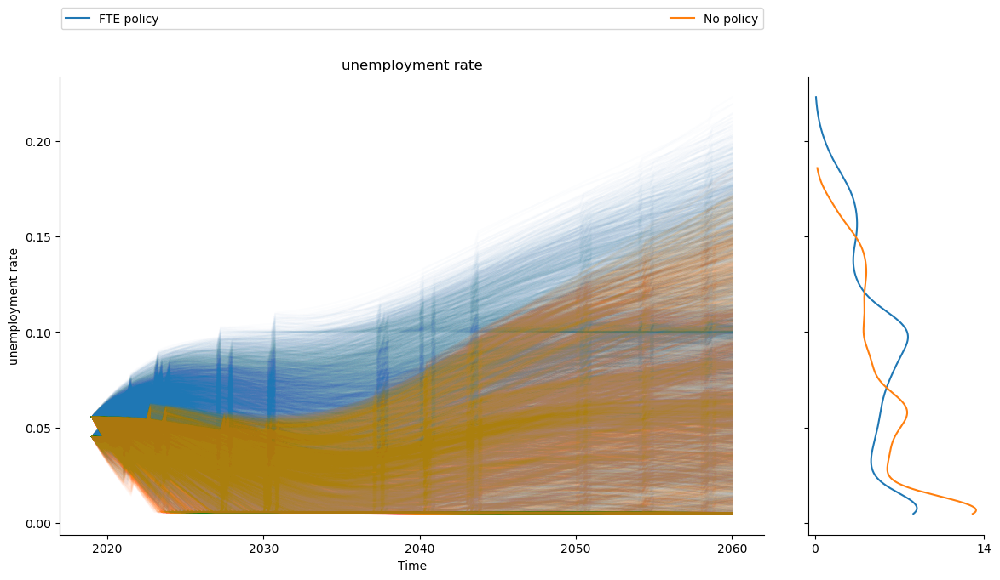

In [51]:
lines(experiments, outcomes, outcomes_to_show=['unemployment rate'],
               group_by= "SWITCH increase FTE per worker", 
               grouping_specifiers = {'No policy': 0, 'FTE policy' : 1}
               , density = Density.KDE) #show lines, and end state density

fig = plt.gcf()
fig.set_size_inches(14,7)
ax = fig.get_axes()
for line in ax[0].get_lines():
    line.set_alpha(0.01)
sns.despine()

plt.show() #show figure

# Multiple Density Plots | Immigration scens

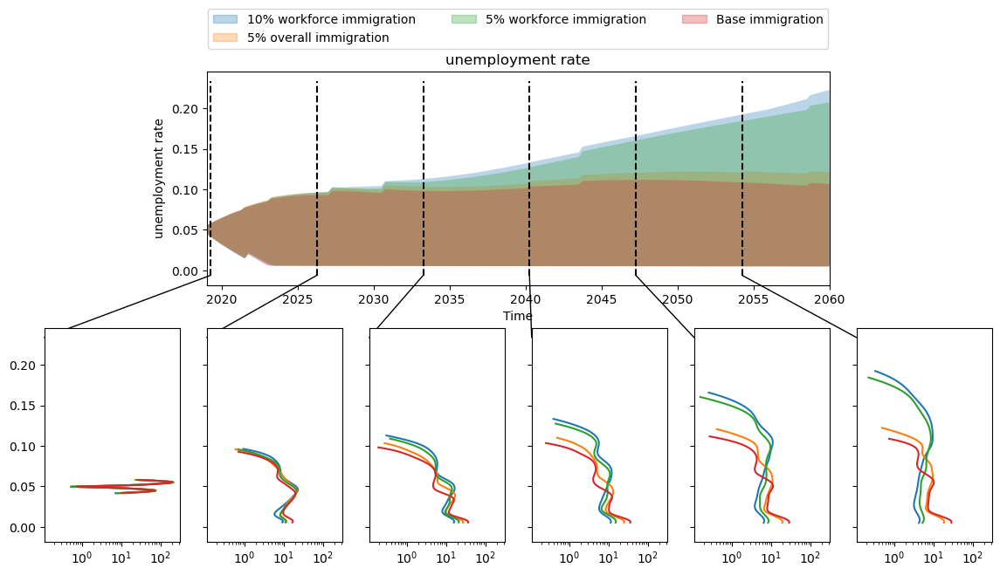

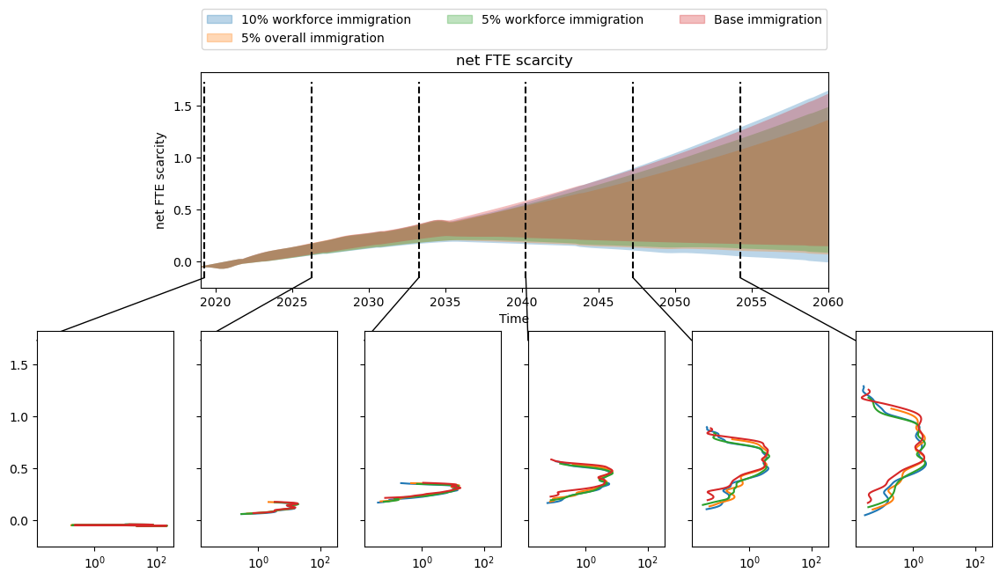

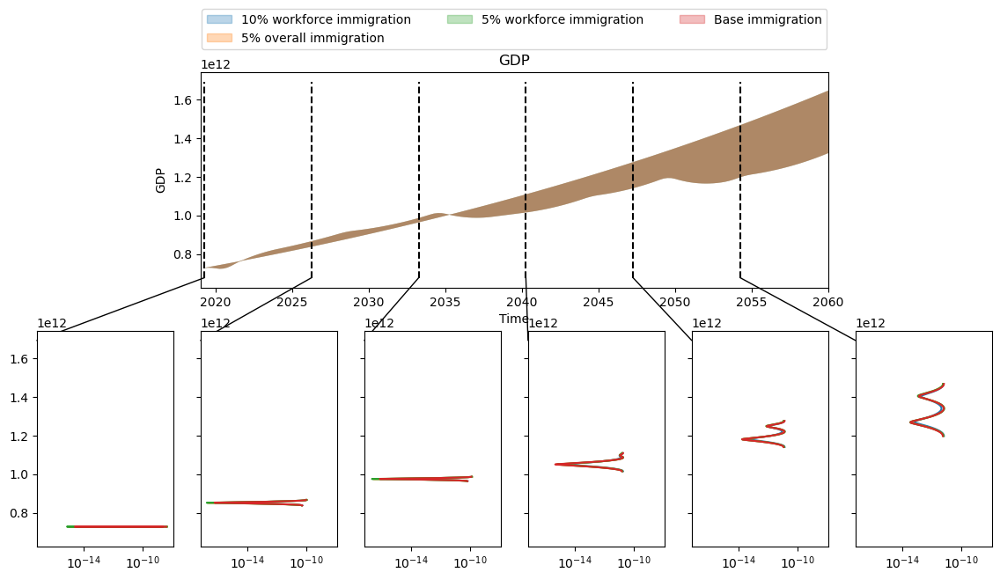

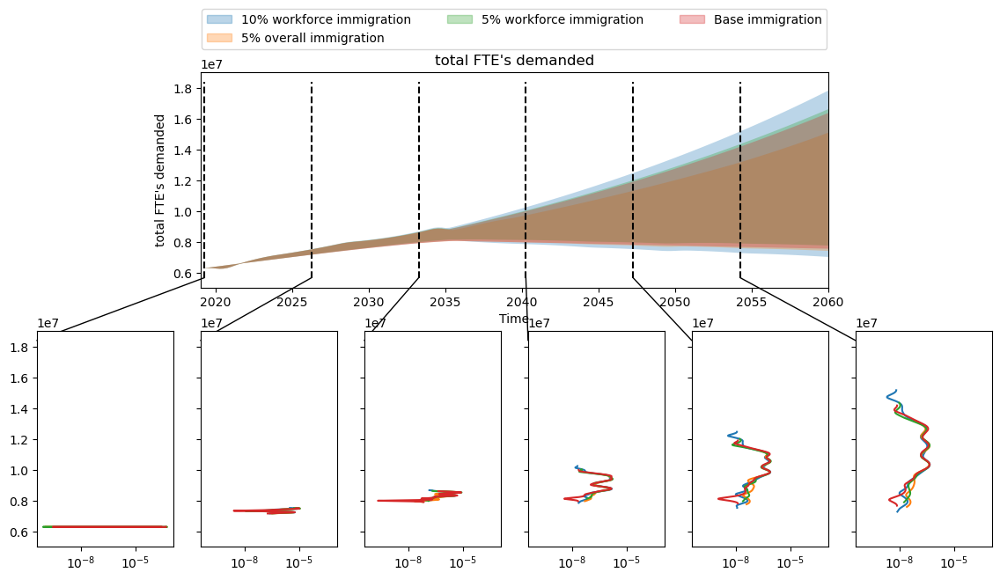

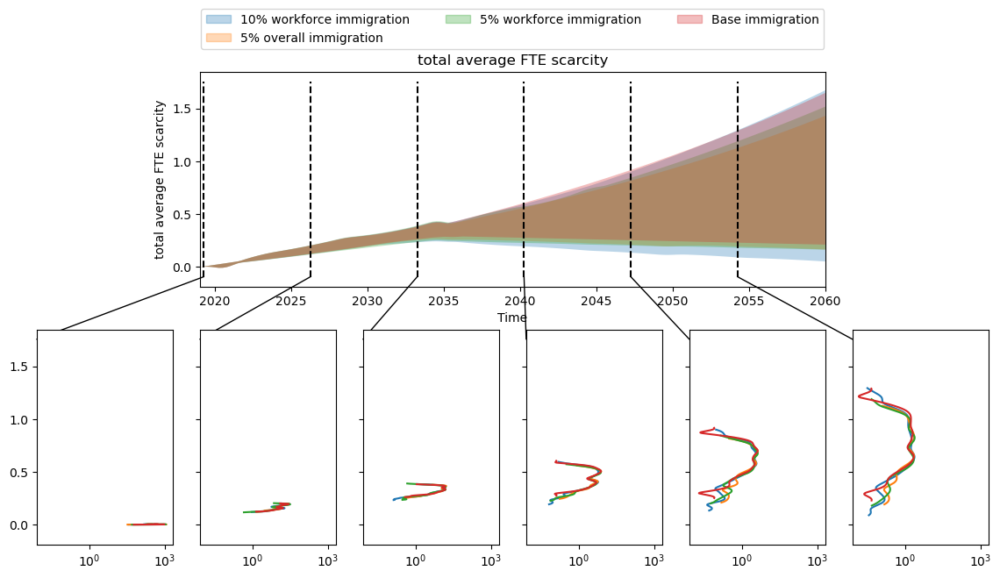

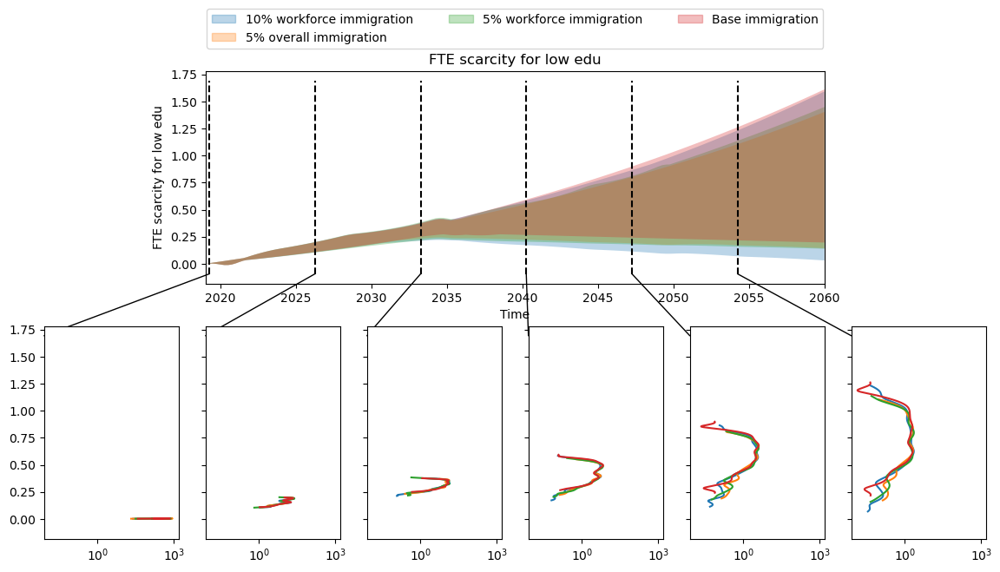

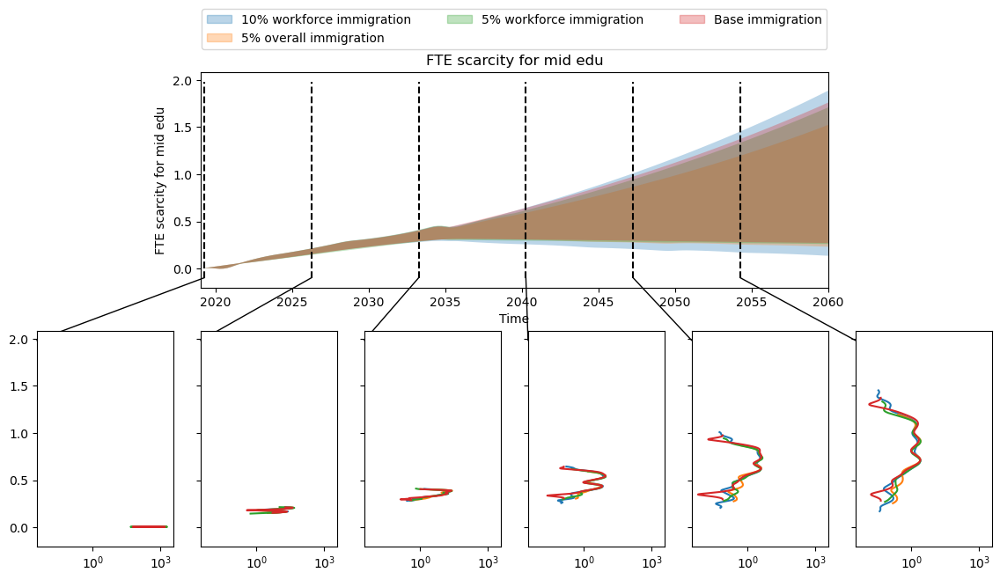

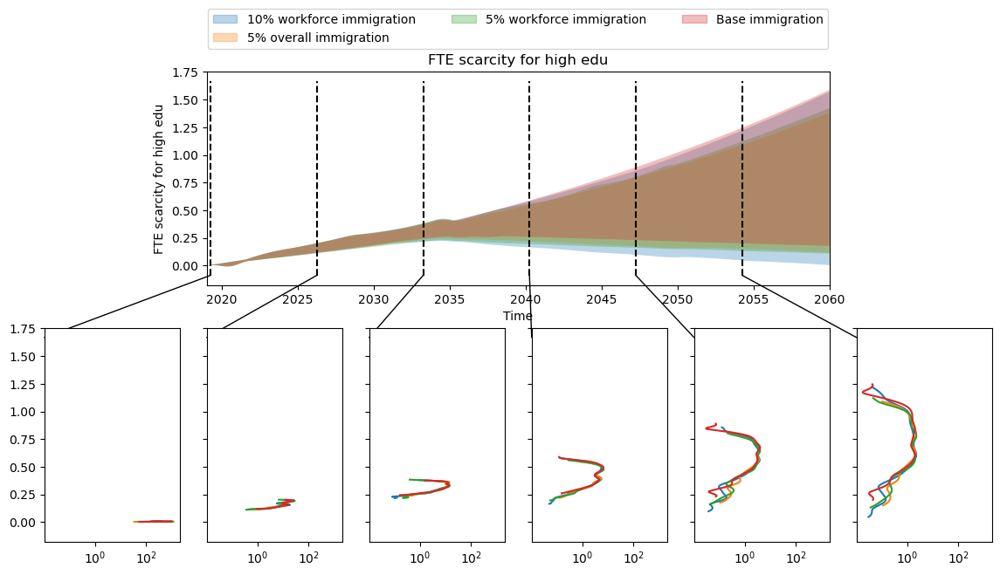

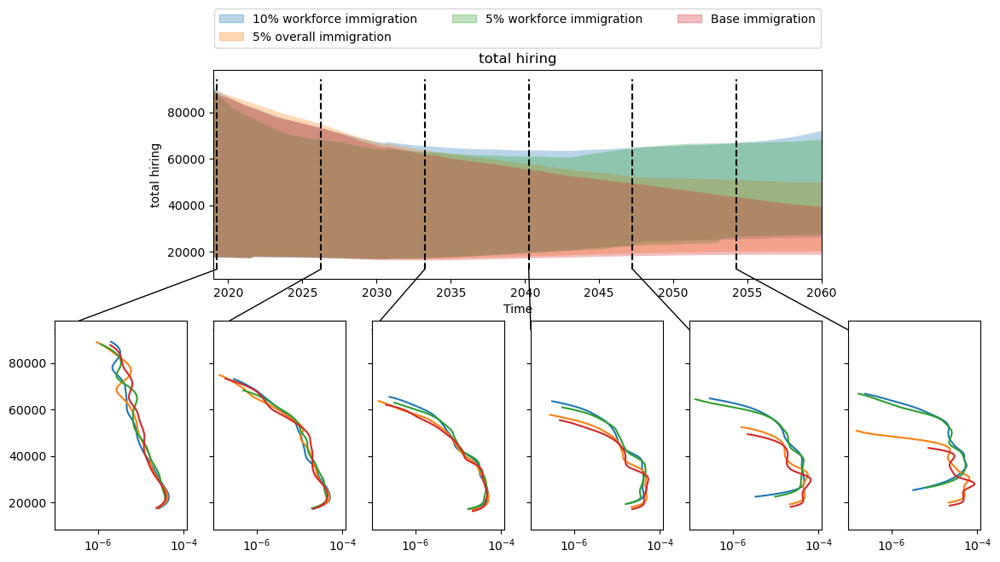

singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix


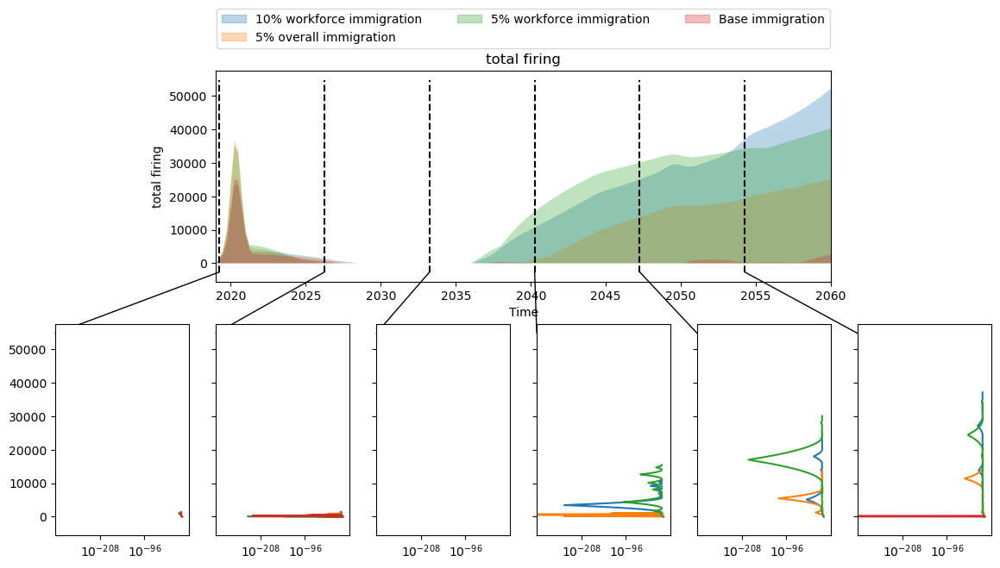

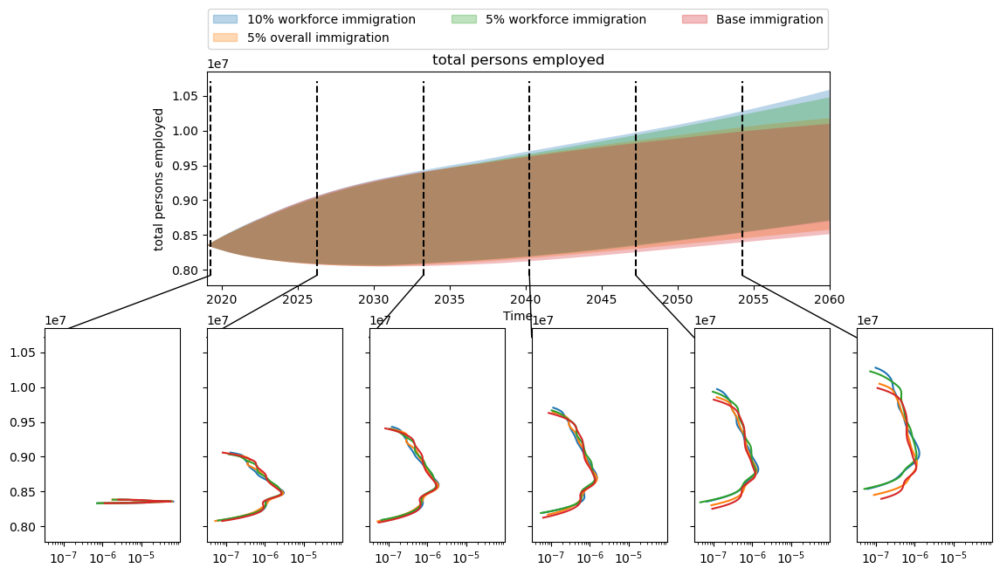

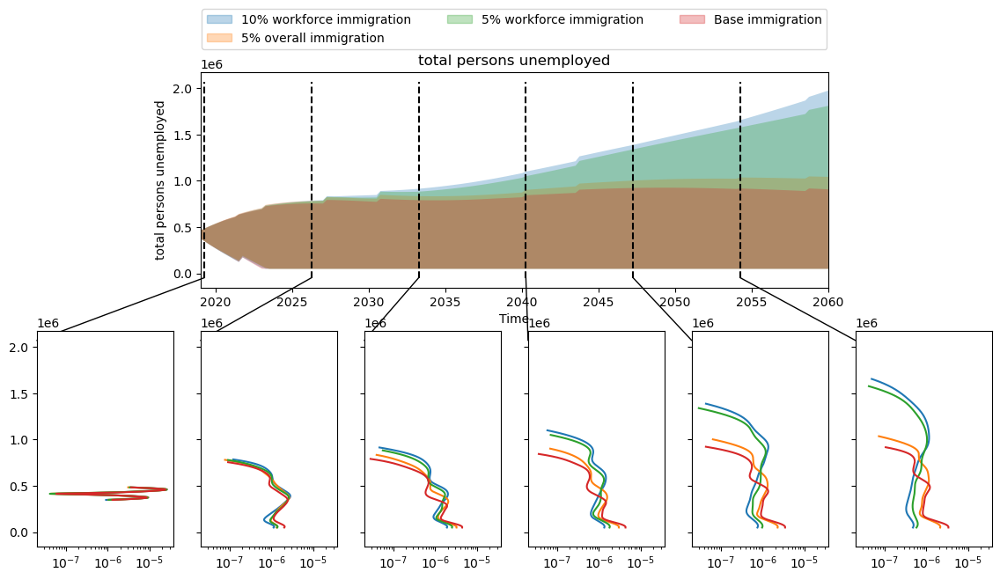

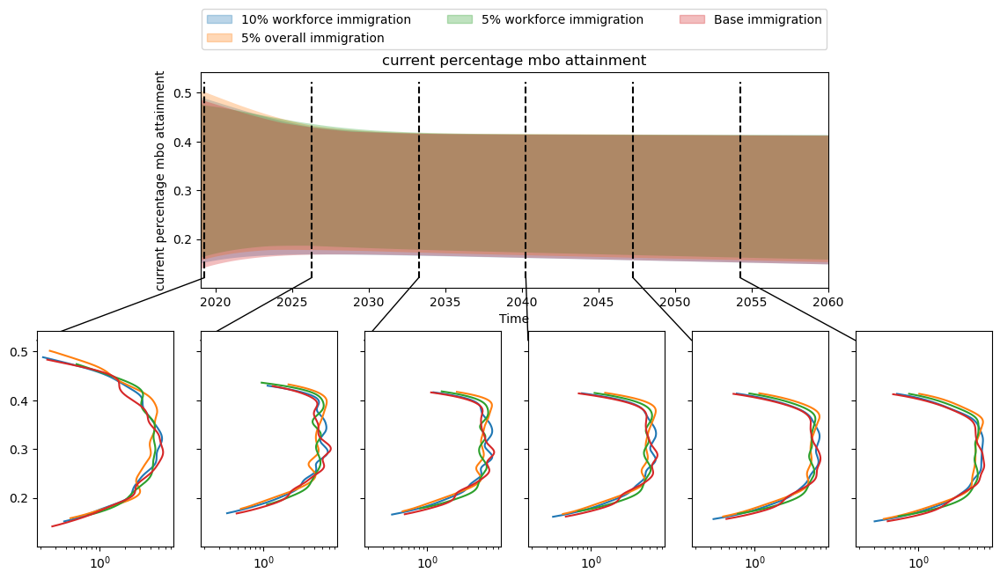

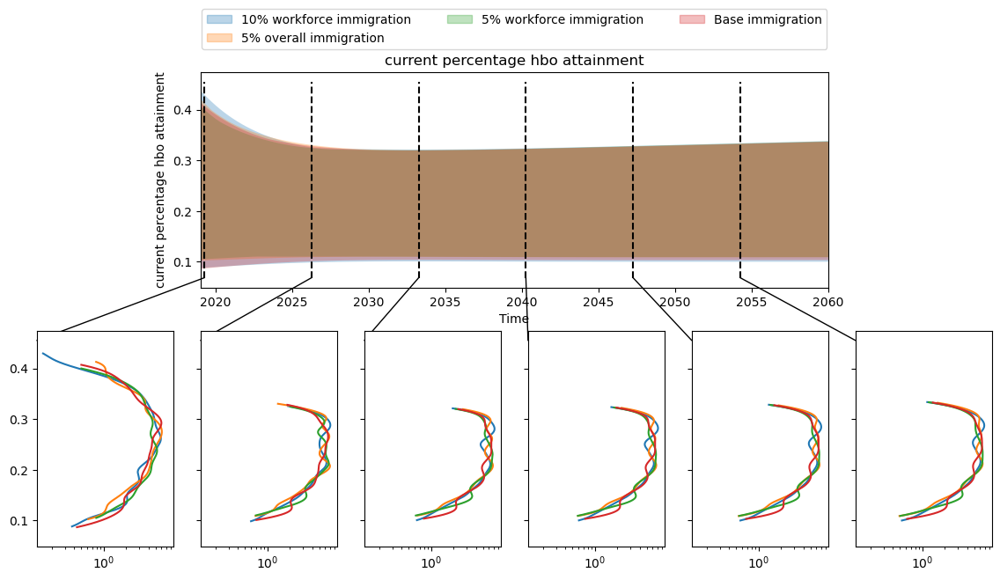

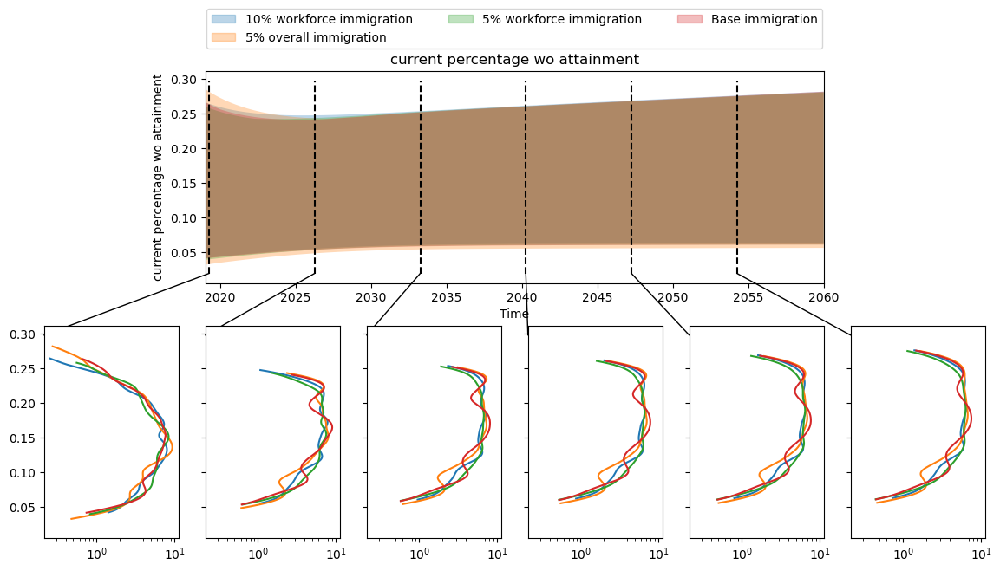

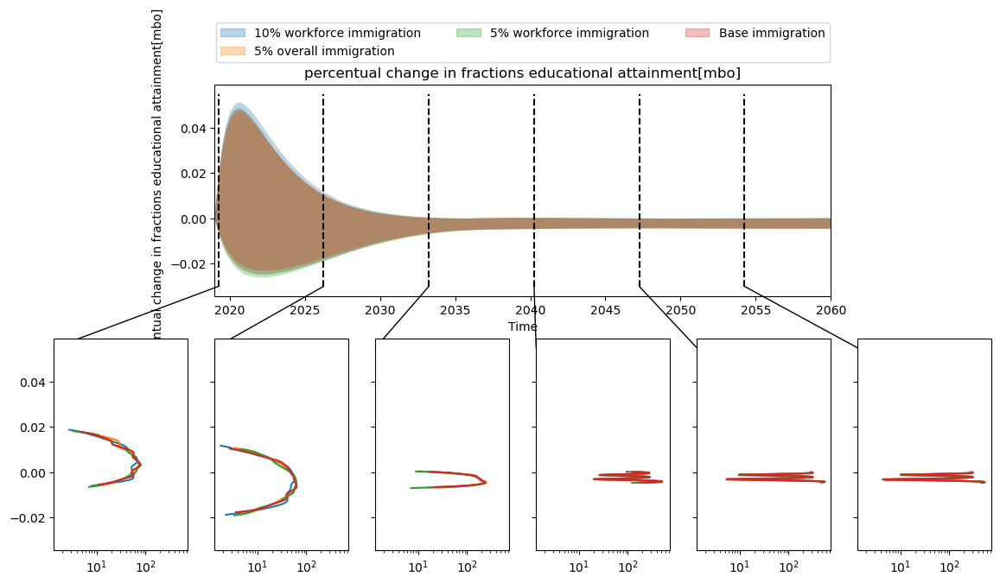

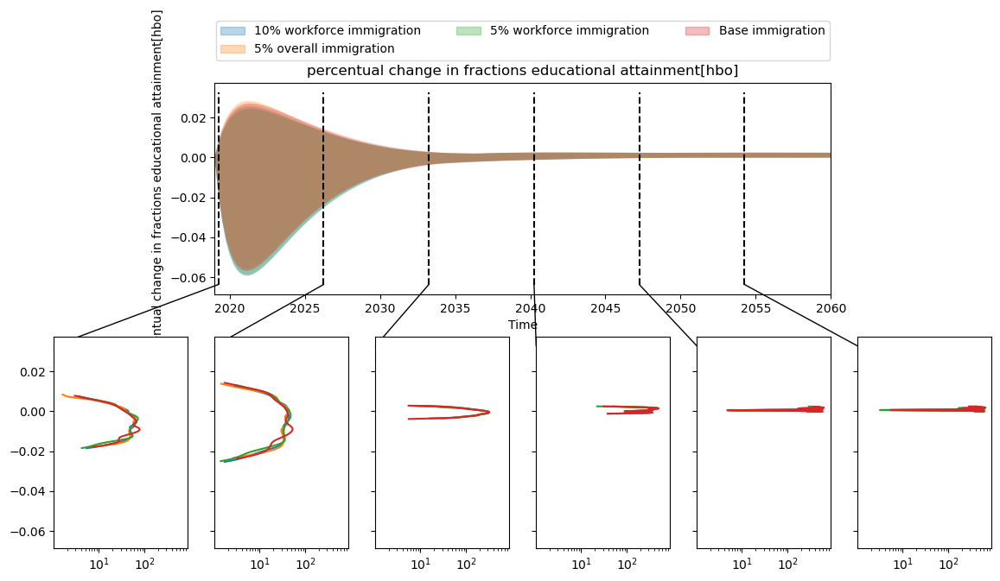

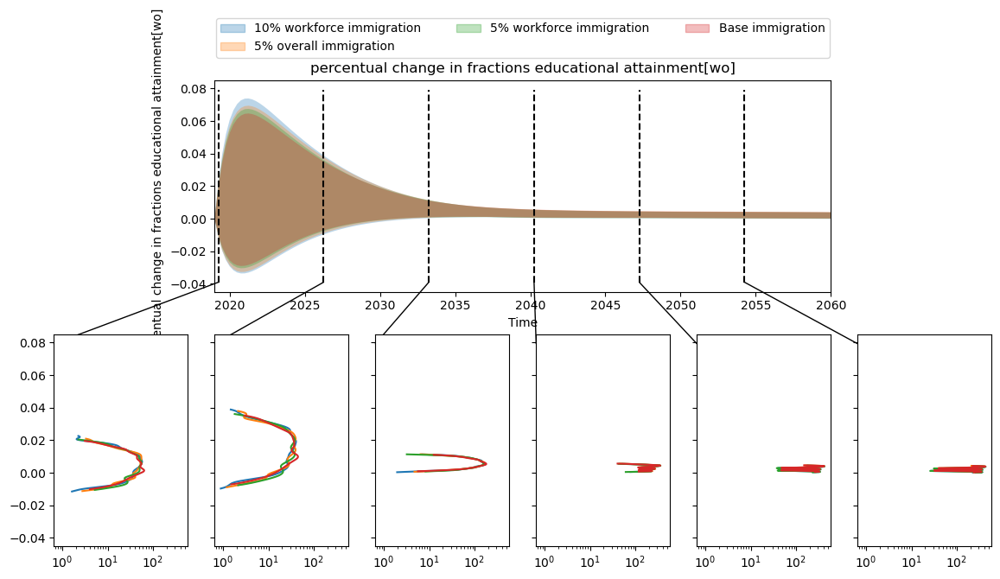

In [111]:
for outcome in outcomes.keys():
    if outcome == 'TIME':
        continue

    # pick points in time for which we want to see a9# density subplot
    time = outcomes["TIME"][0, :]
    times = time[1 :: math.ceil(time.shape[0] / 6)].tolist()


    multiple_densities(
        experiments,
        outcomes ,outcomes_to_show=[outcome],
        log=True,
        points_in_time=times,
        group_by="SWITCH immigration scenarios", 
        grouping_specifiers = {'Base immigration': 0, '5% overall immigration' : 1,
                            '5% workforce immigration' : 2, '10% workforce immigration' : 3},
        density=Density.KDE,
        fill=True,
    )

    fig = plt.gcf()
    fig.set_size_inches(14, 7)

    plt.show()



# Multiple Density Plots | Tech scens

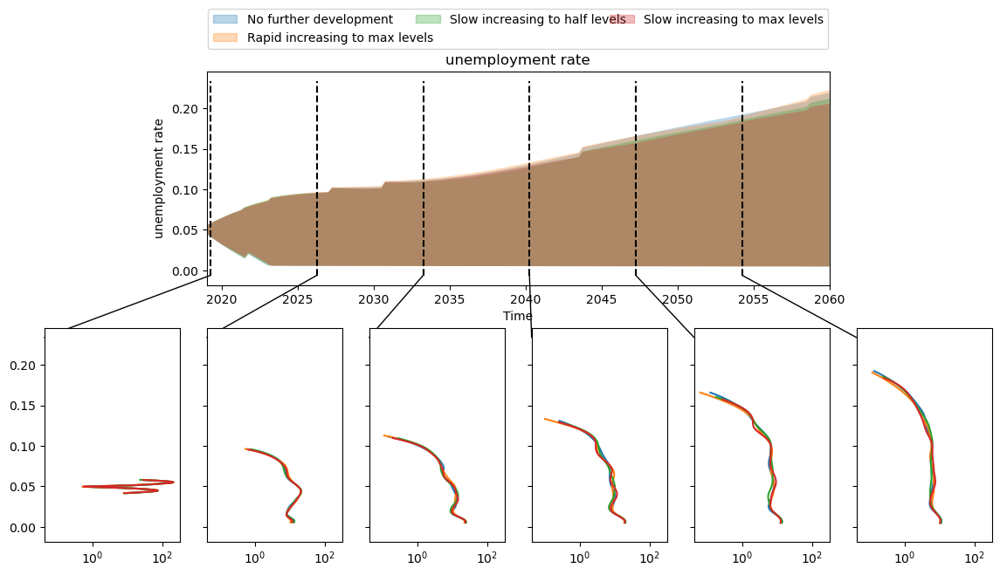

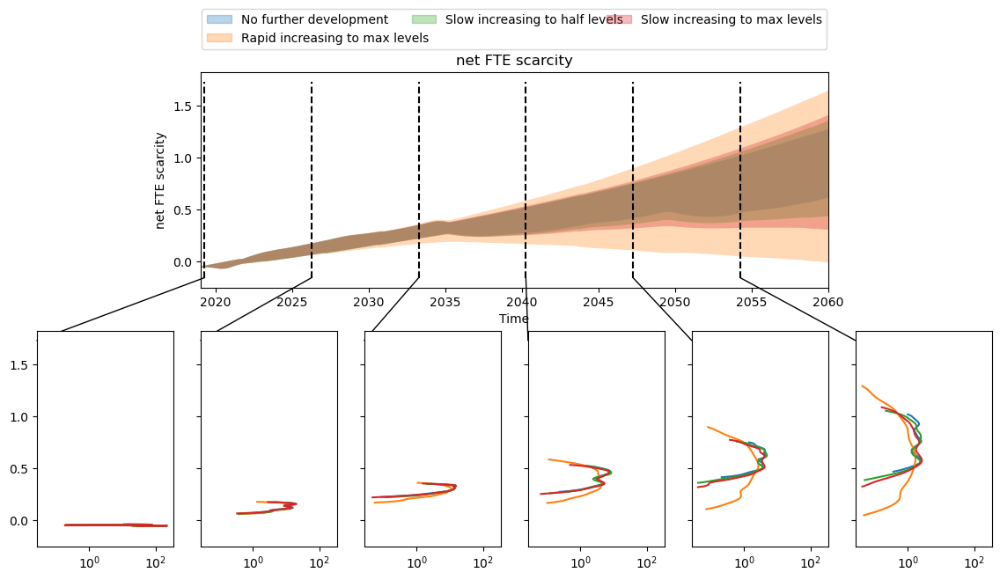

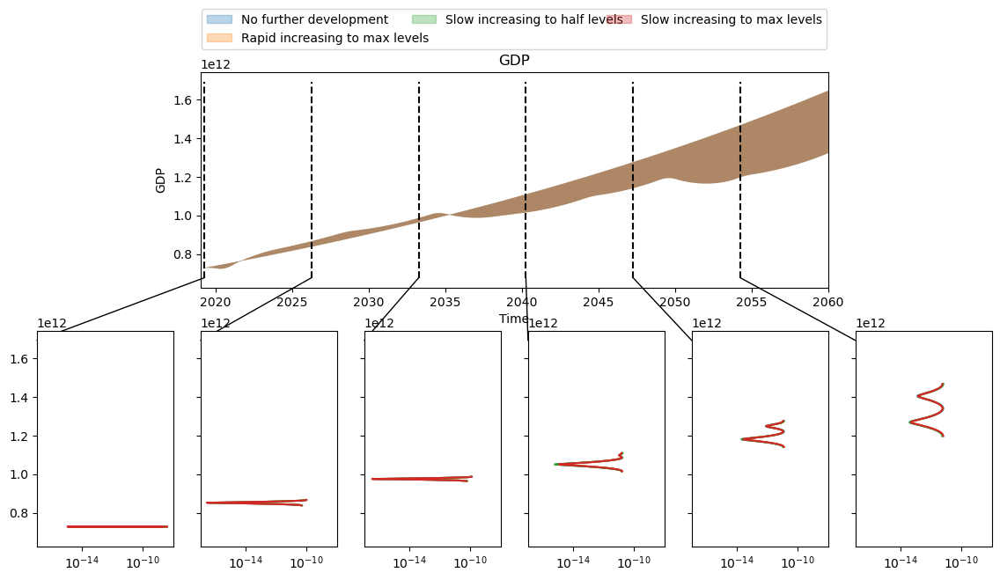

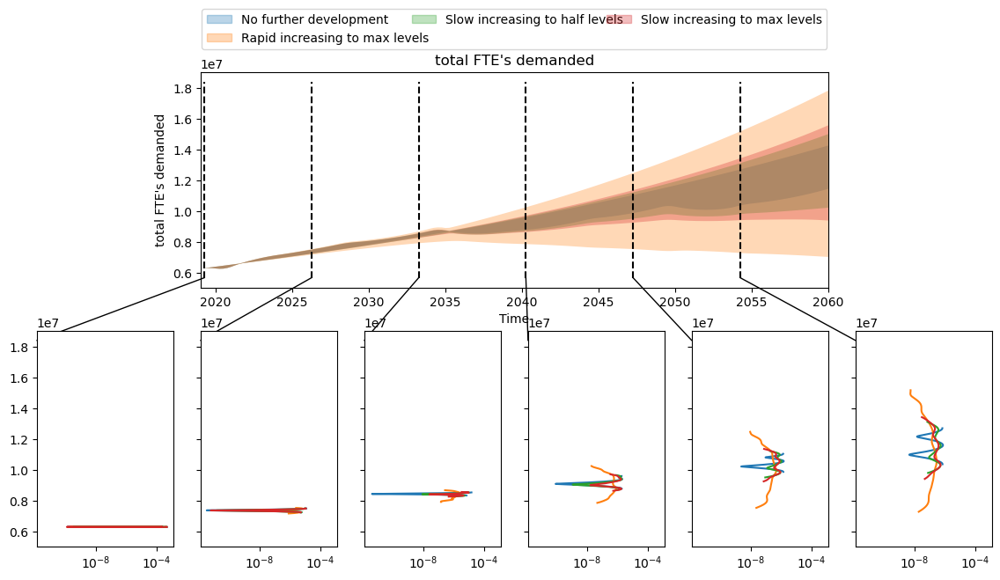

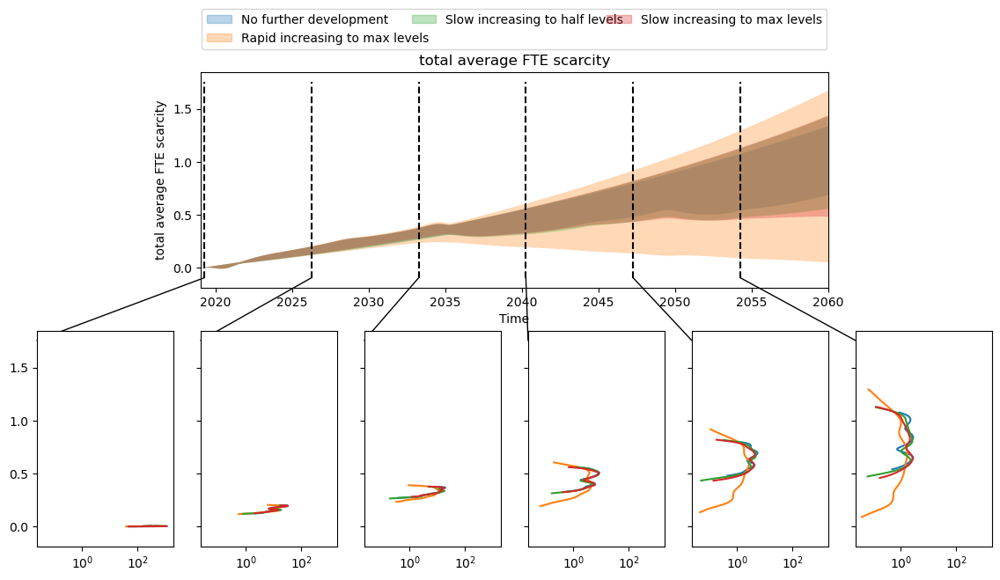

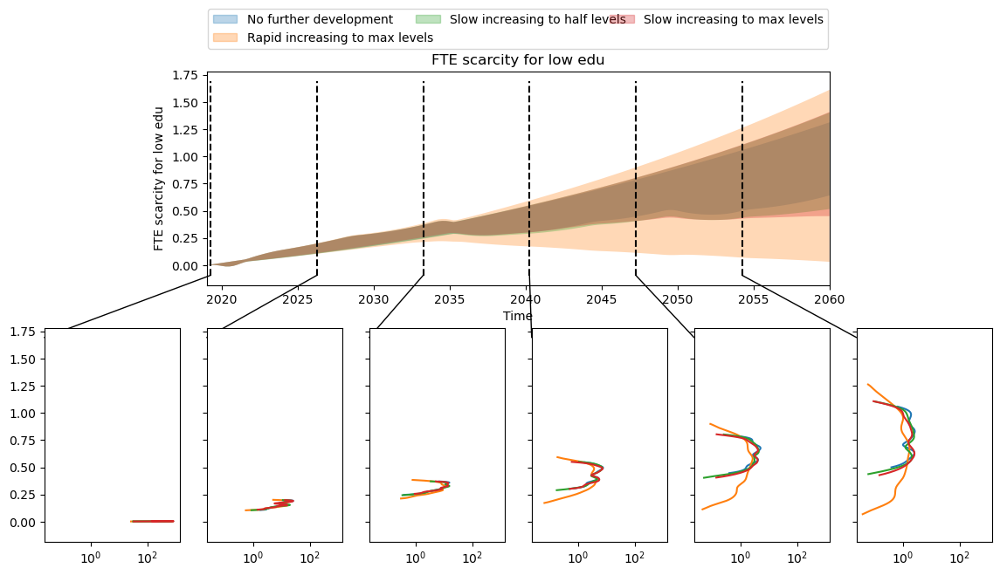

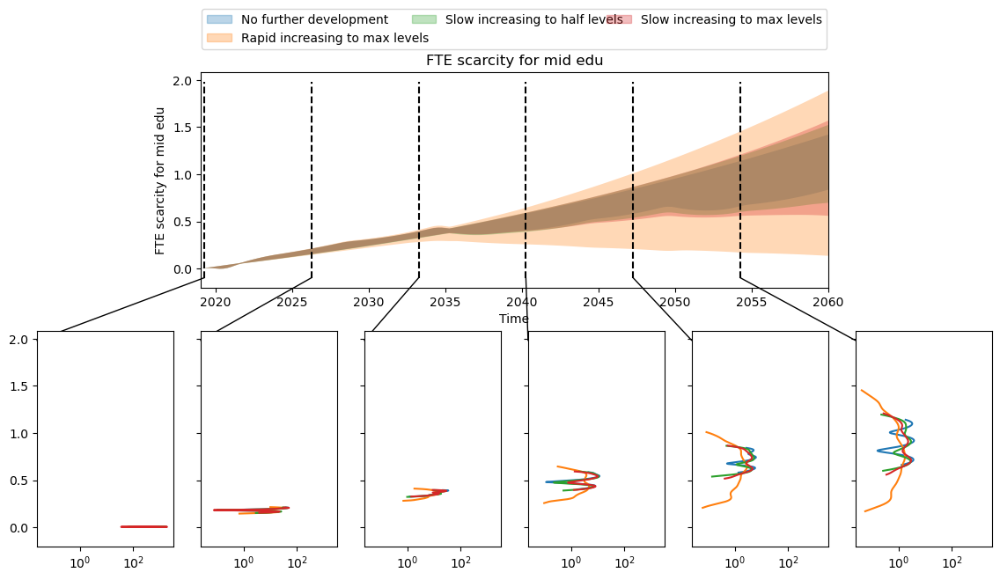

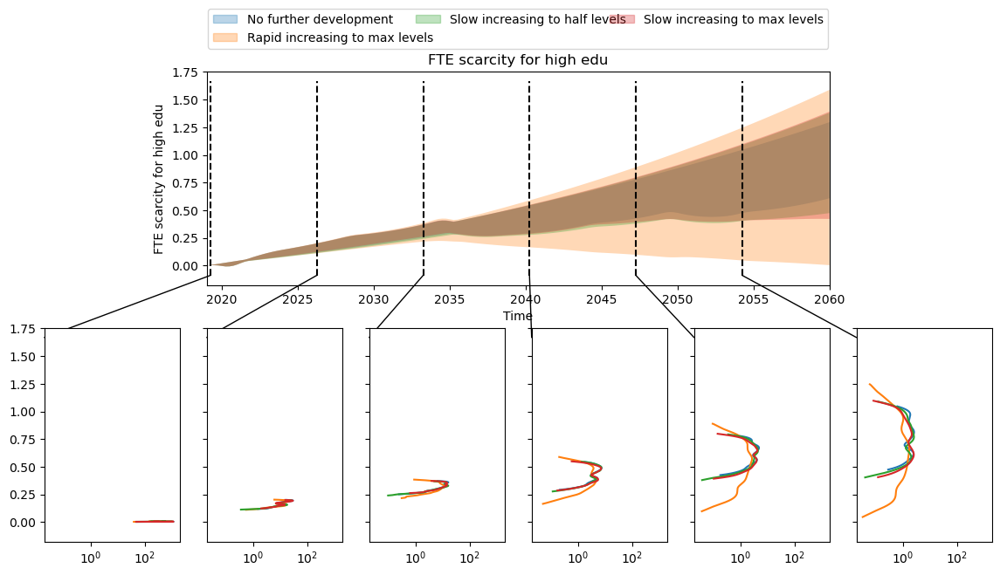

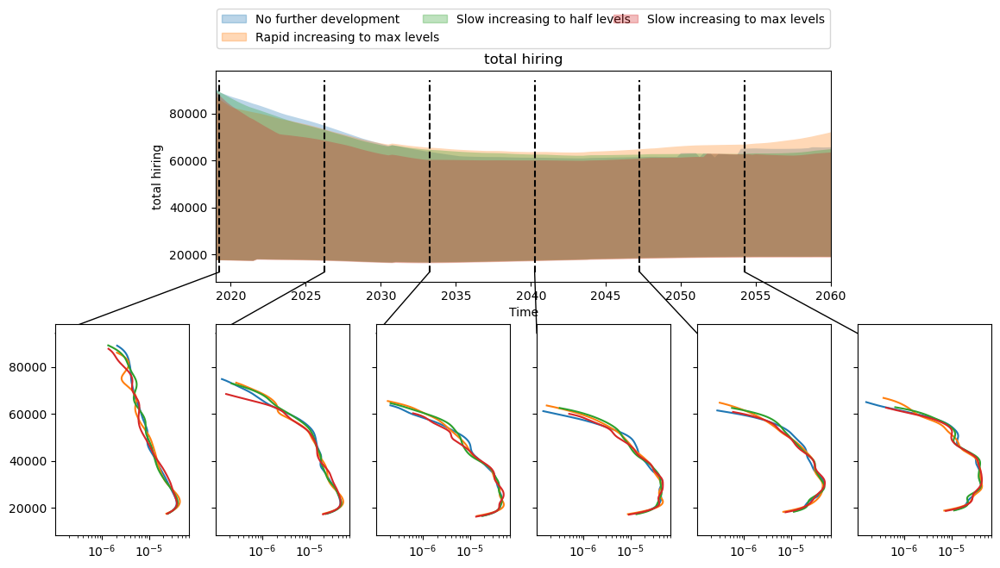

singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix


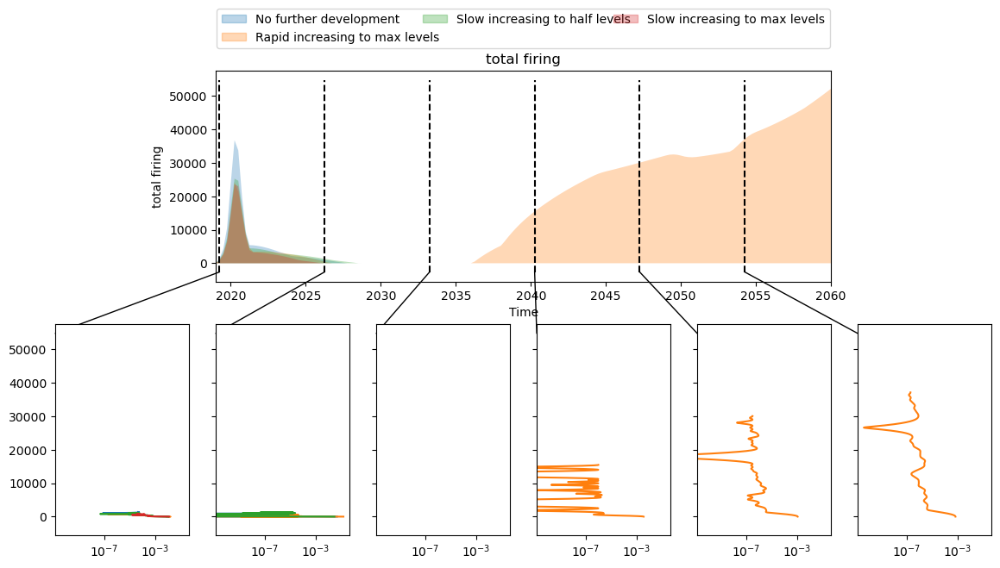

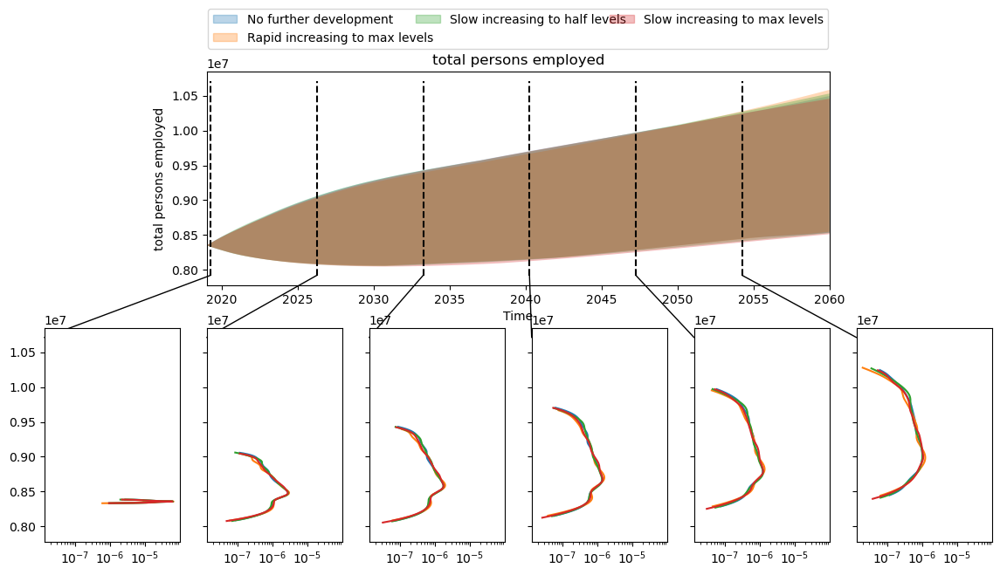

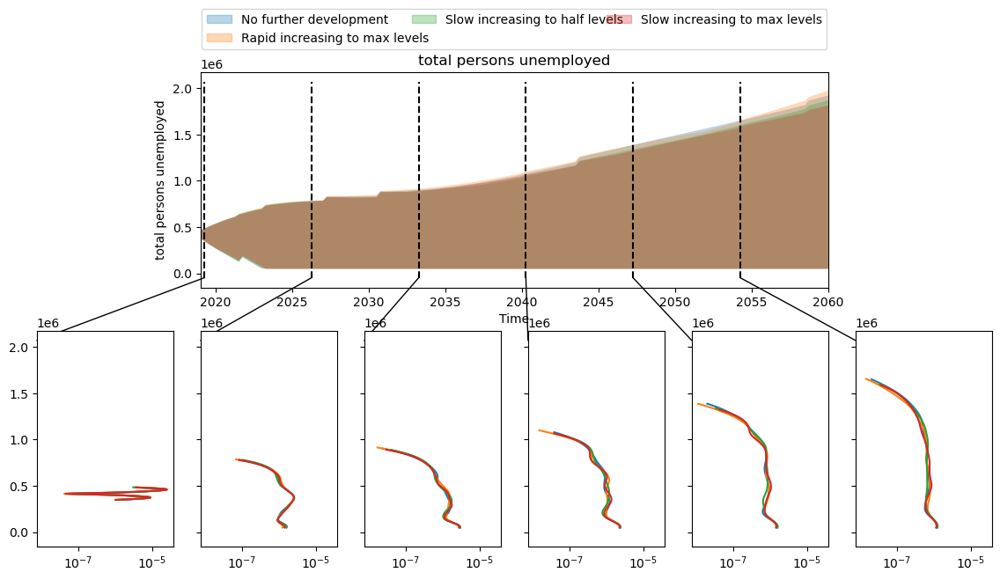

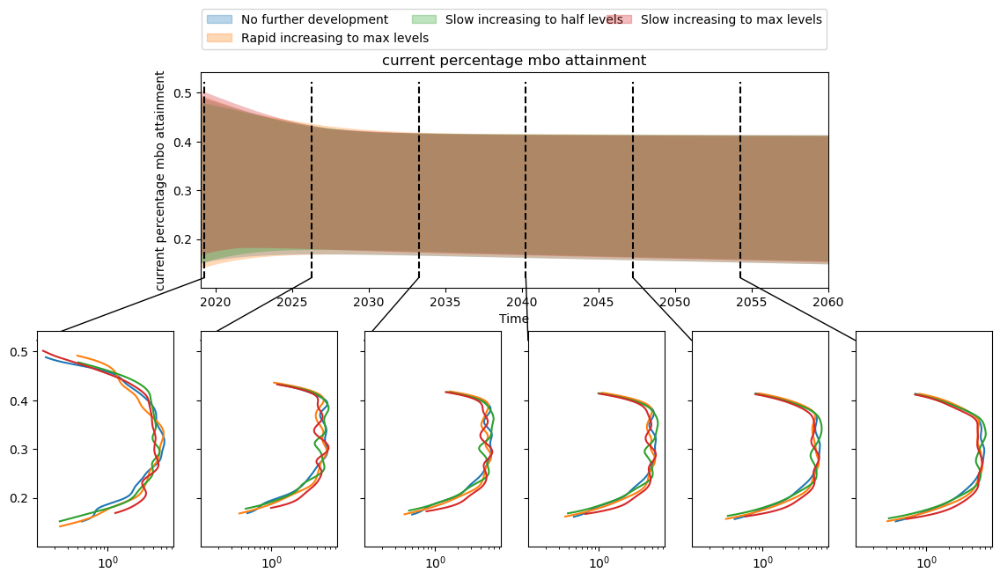

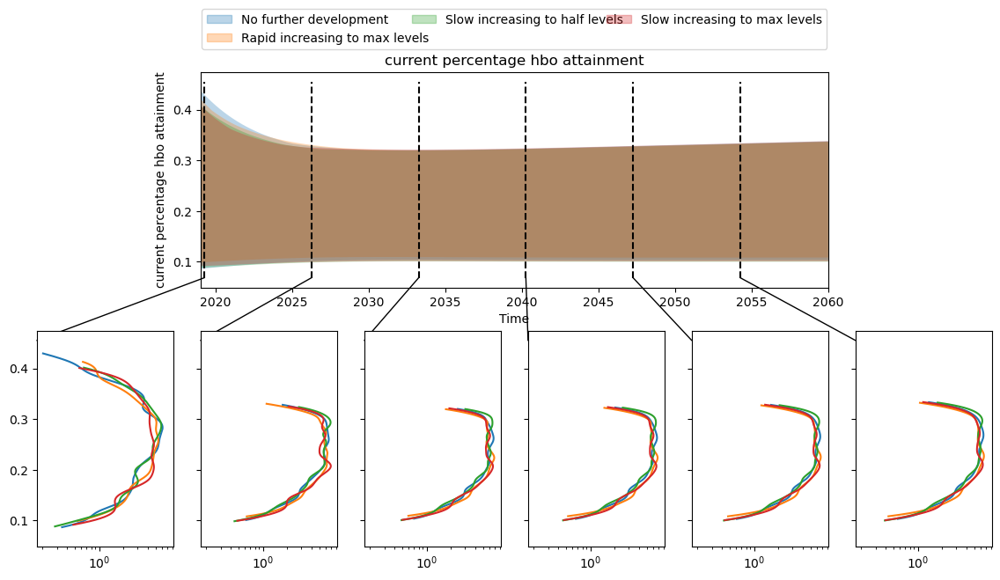

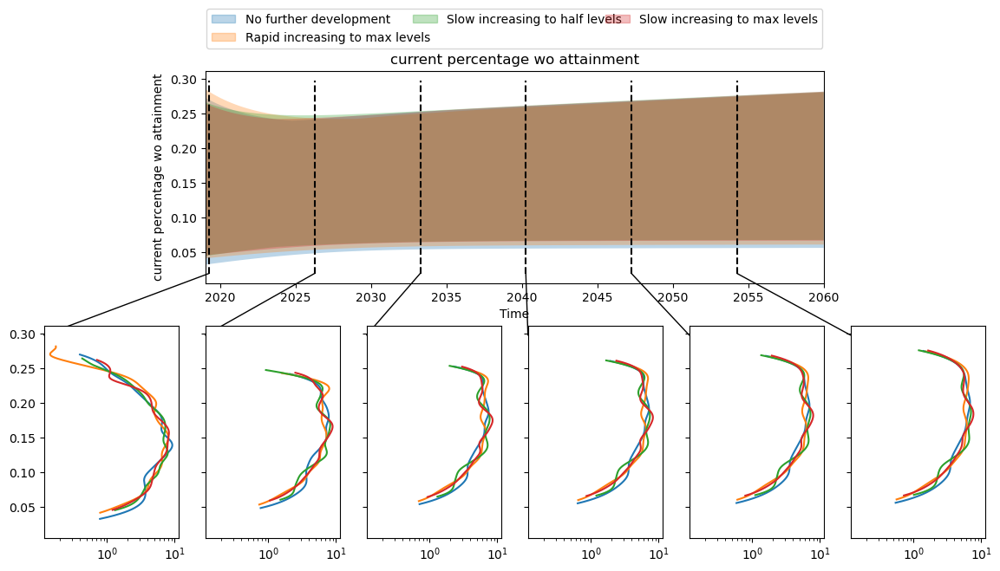

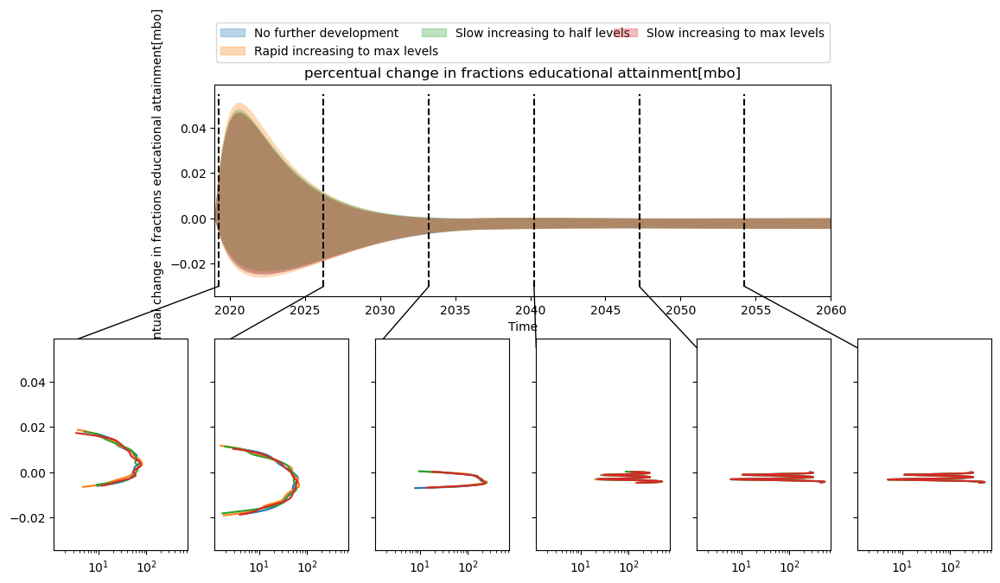

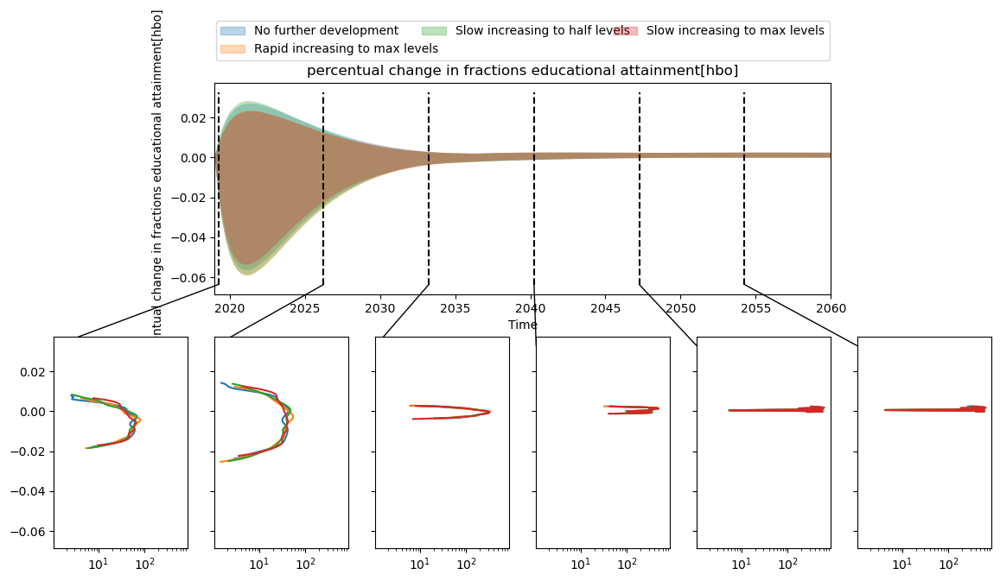

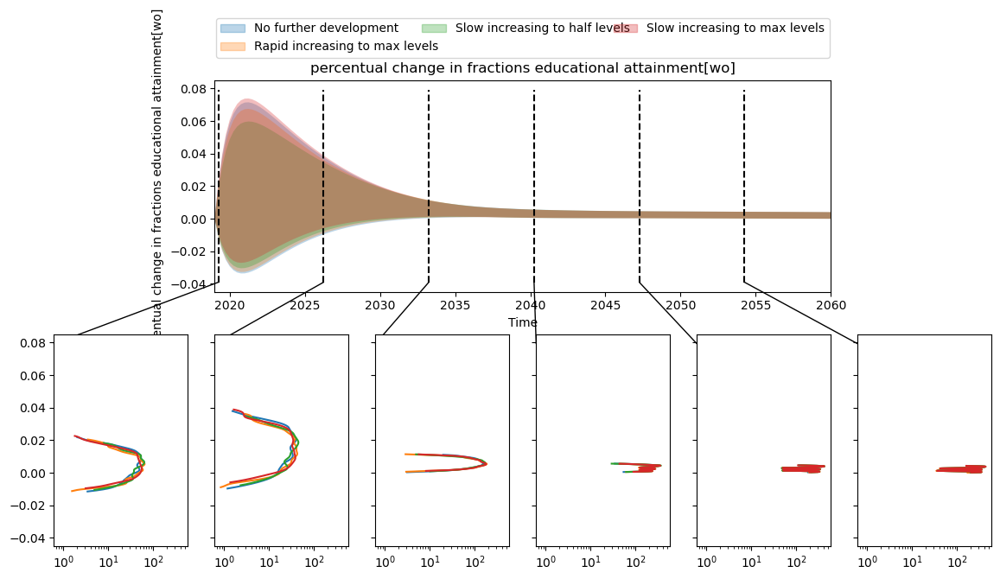

In [114]:
for outcome in outcomes.keys():
    if outcome == 'TIME':
        continue

    # pick points in time for which we want to see a9# density subplot
    time = outcomes["TIME"][0, :]
    times = time[1 :: math.ceil(time.shape[0] / 6)].tolist()


    multiple_densities(
        experiments,
        outcomes ,outcomes_to_show=[outcome],
        log=True,
        points_in_time=times,
        group_by= "SWITCH technological development scenario", 
        grouping_specifiers = {'No further development': 0, 'Slow increasing to max levels' : 1,
                                'Slow increasing to half levels' : 2, 'Rapid increasing to max levels' : 3},
        density=Density.KDE,
        fill=True,
    )

    fig = plt.gcf()
    fig.set_size_inches(14, 7)

    plt.show()

# Mutliple Density Plots | GDP scens

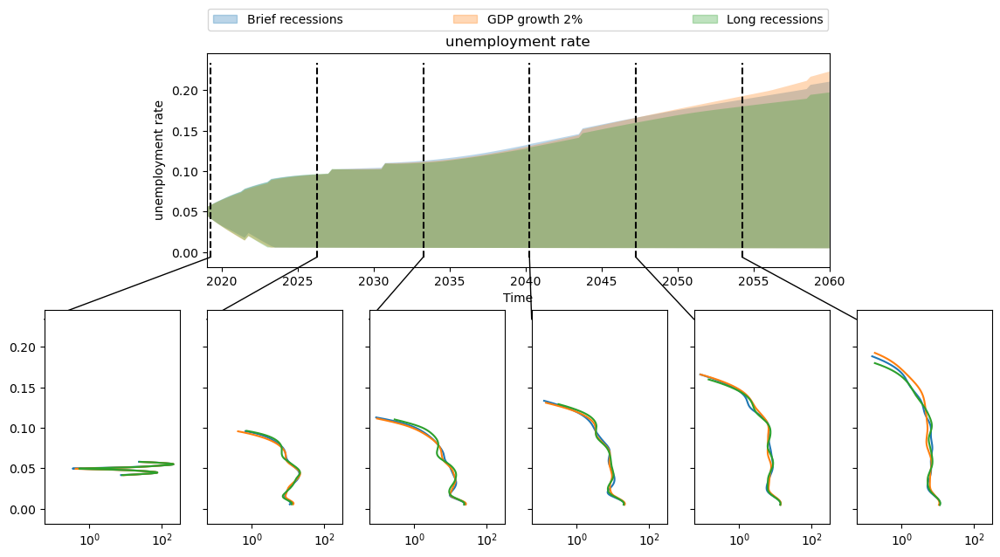

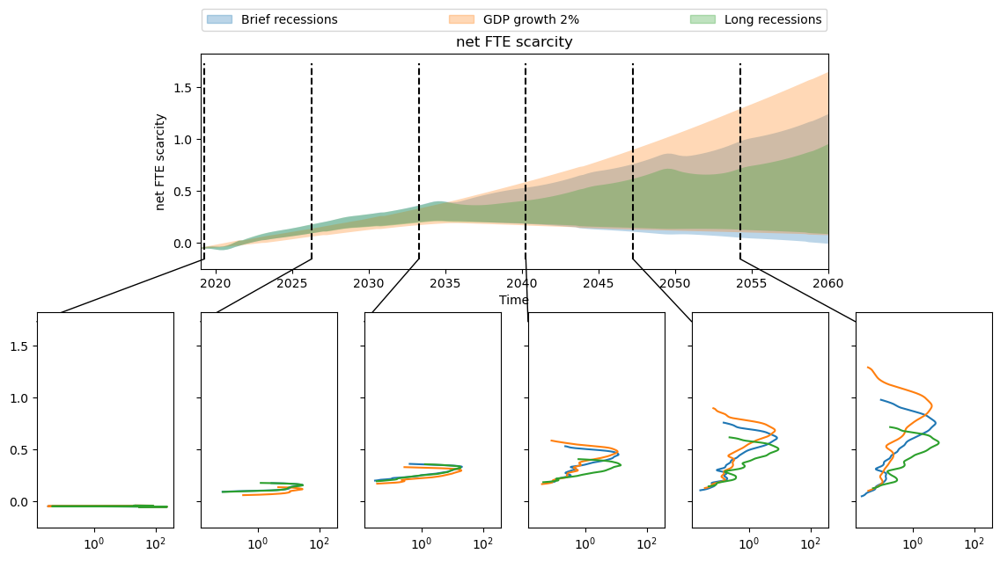

singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix


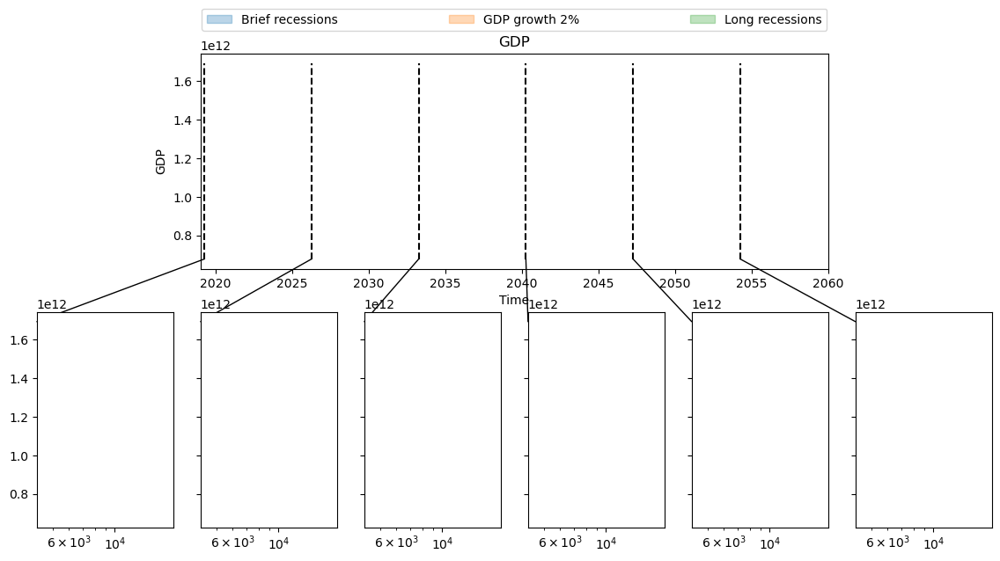

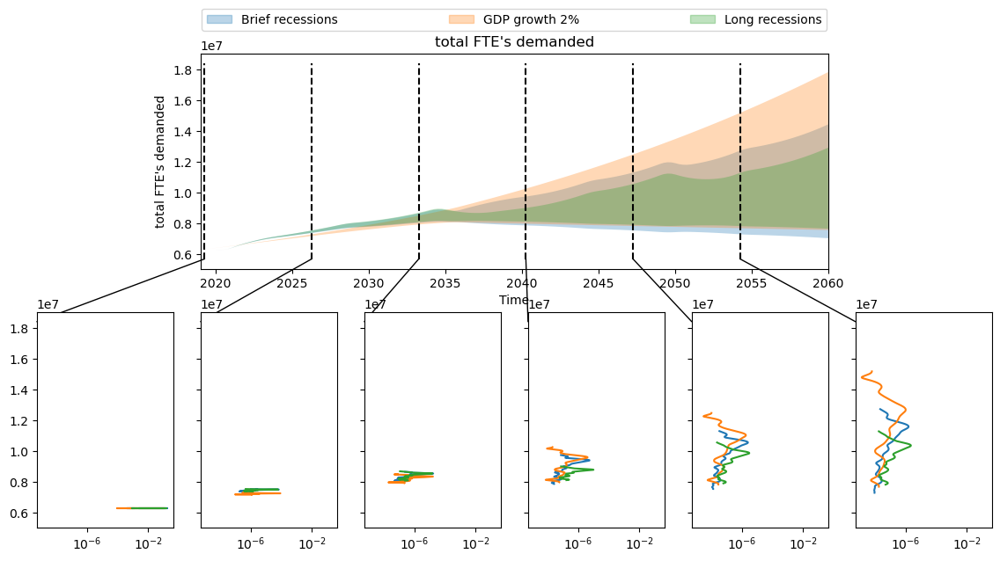

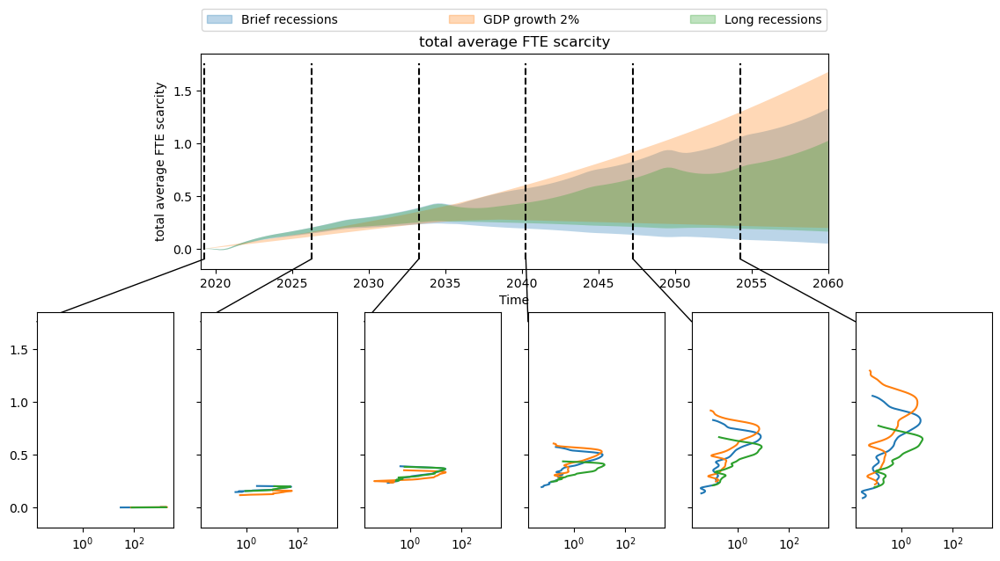

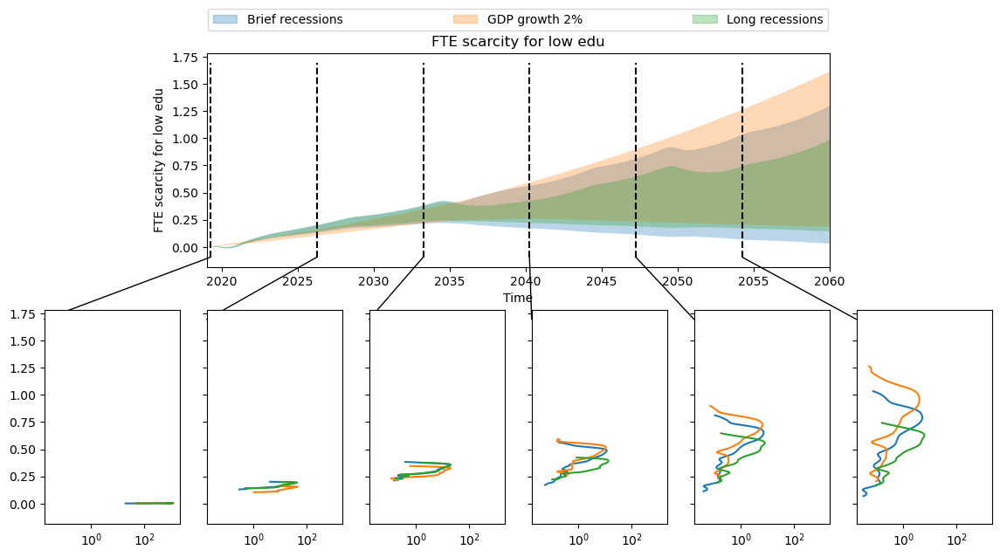

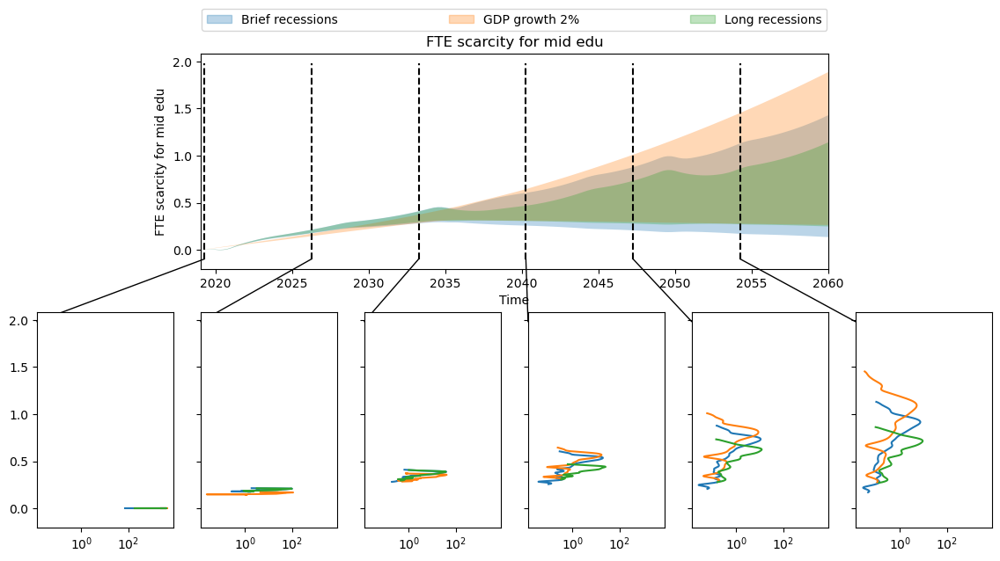

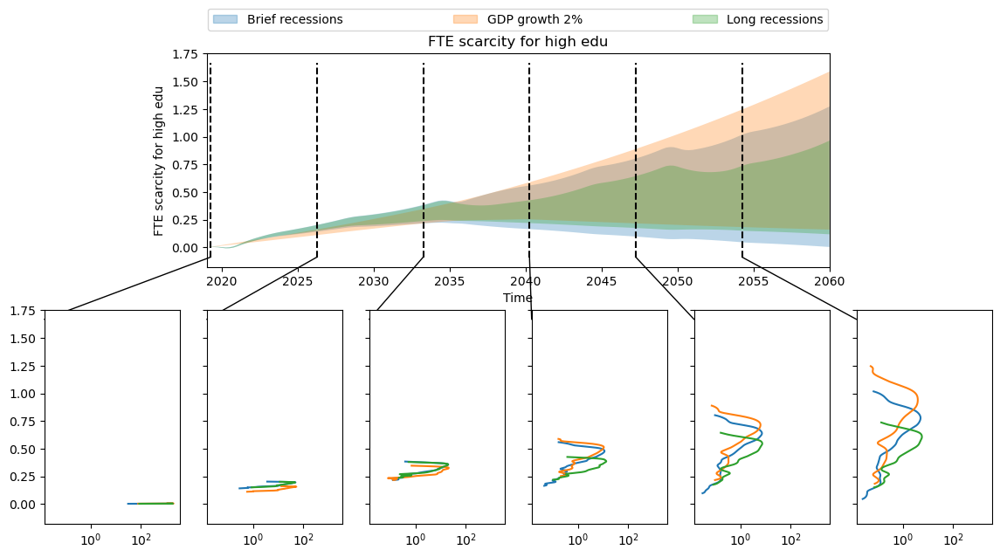

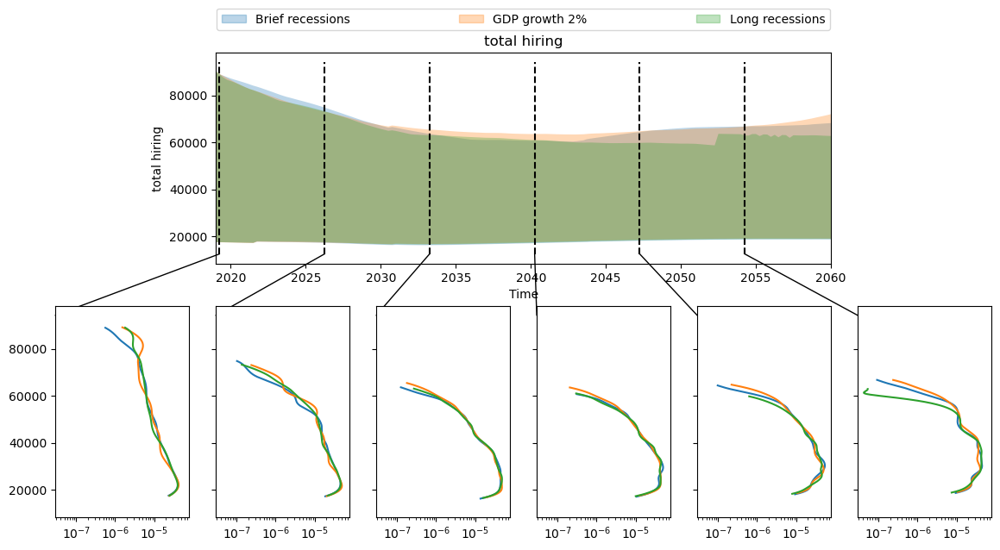

singular matrix
singular matrix
singular matrix
singular matrix
singular matrix
singular matrix


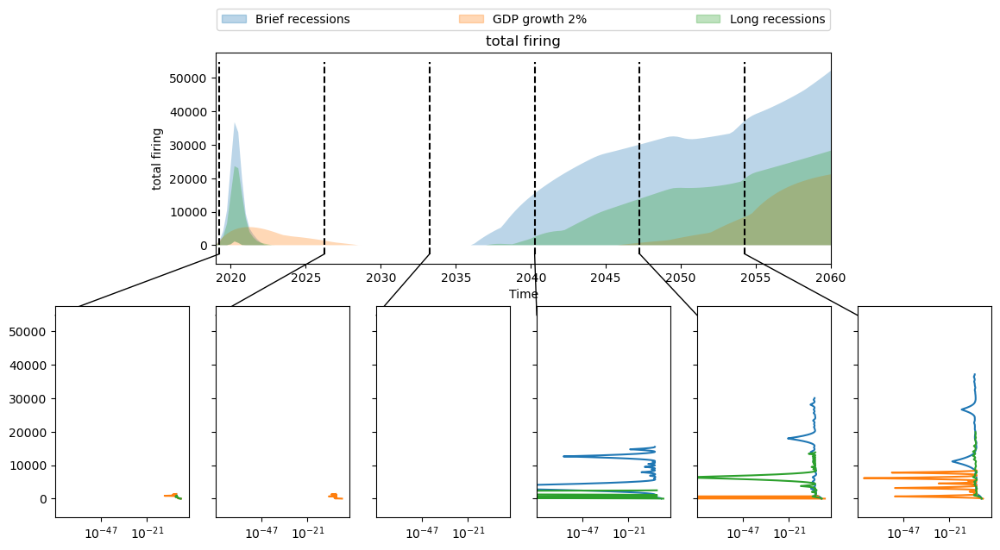

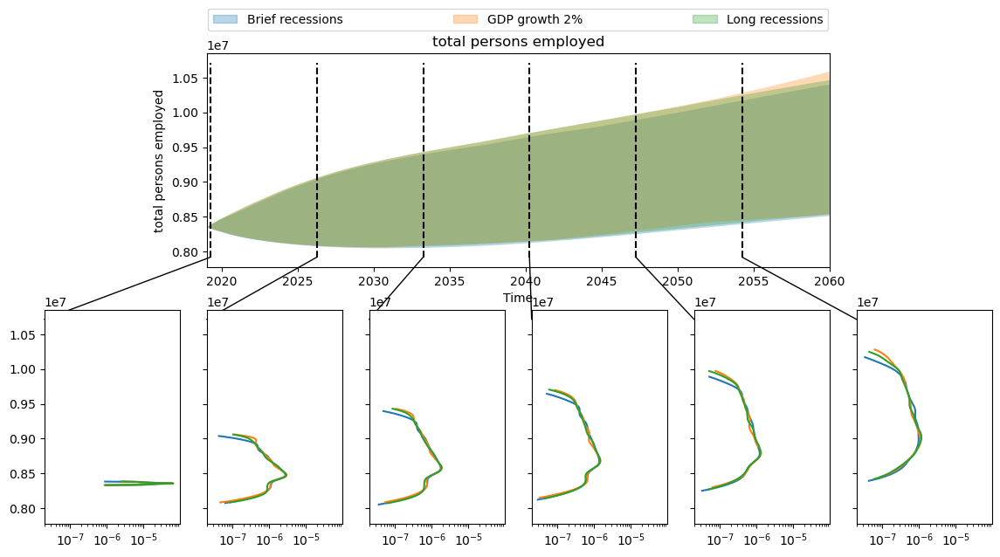

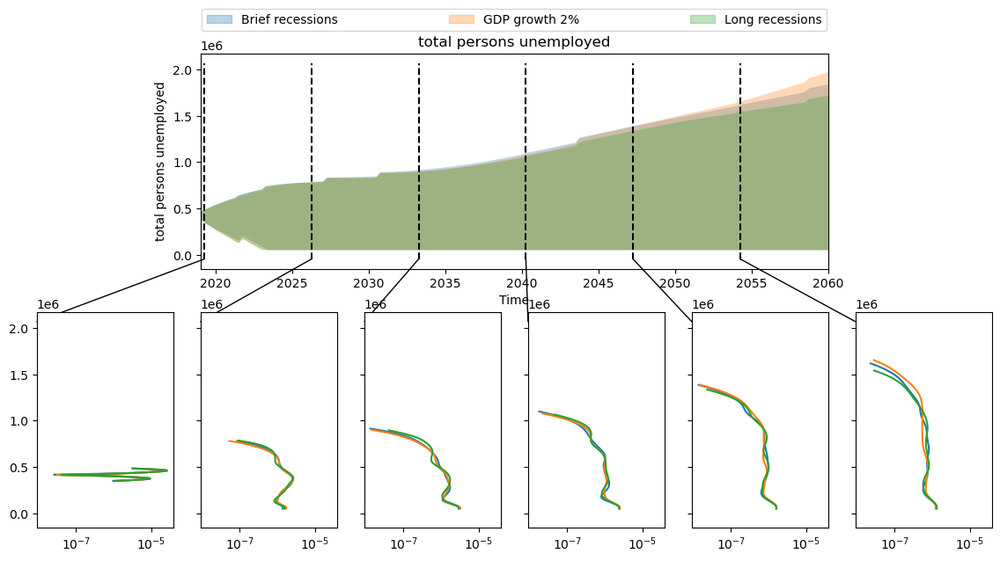

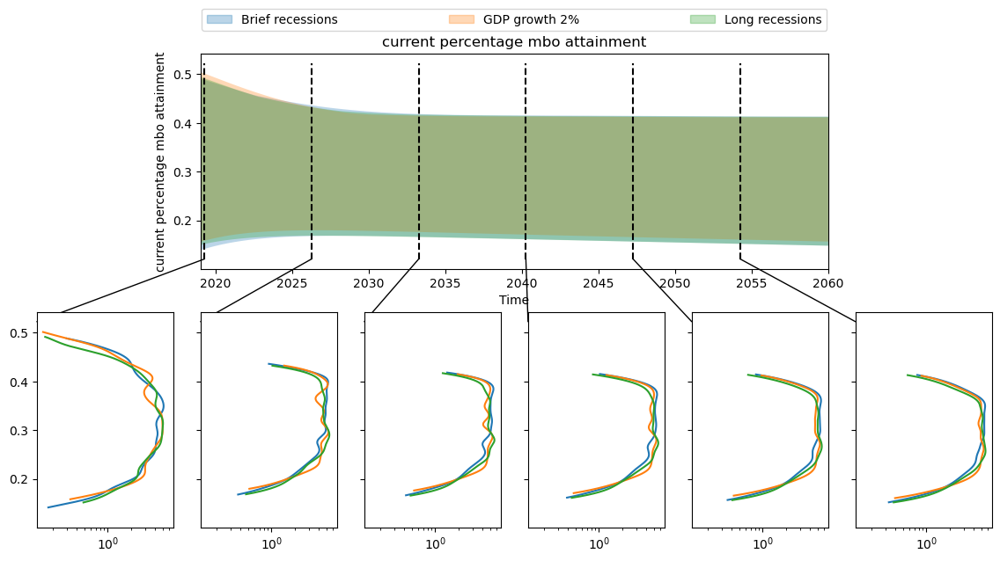

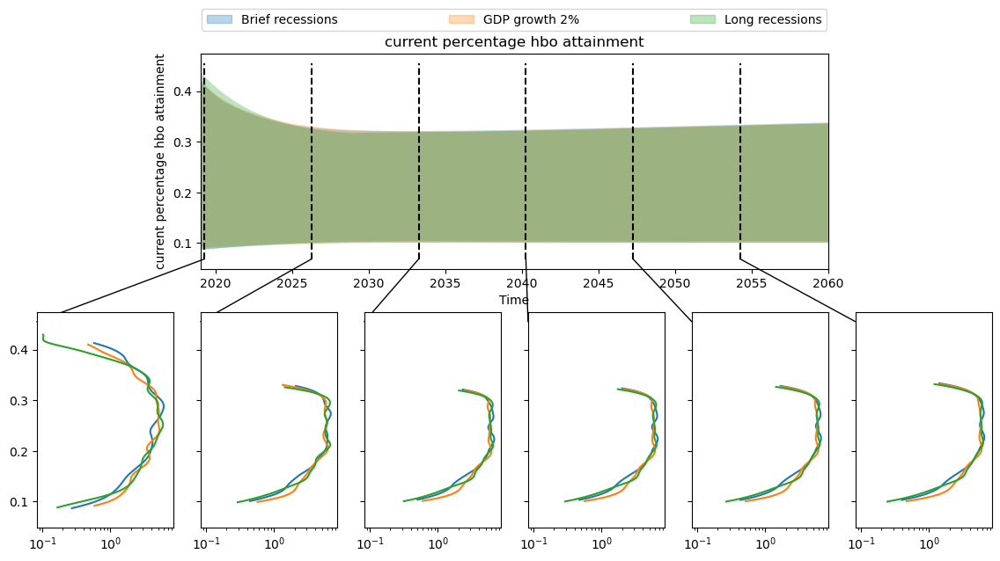

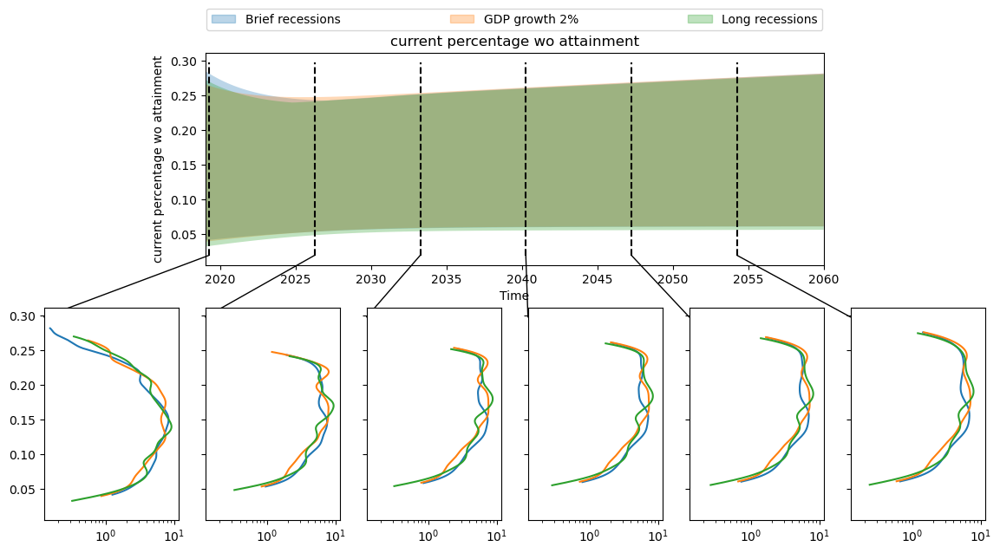

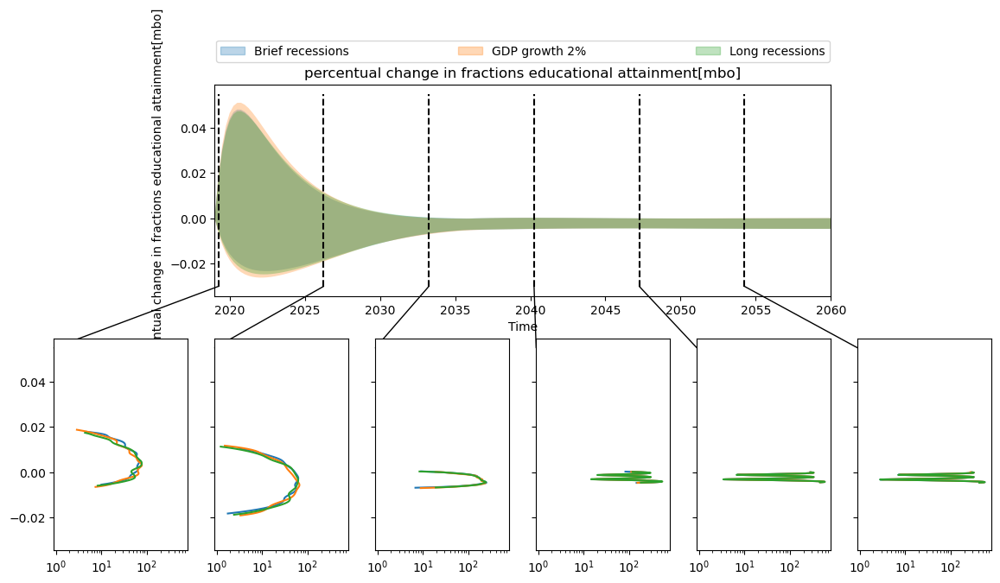

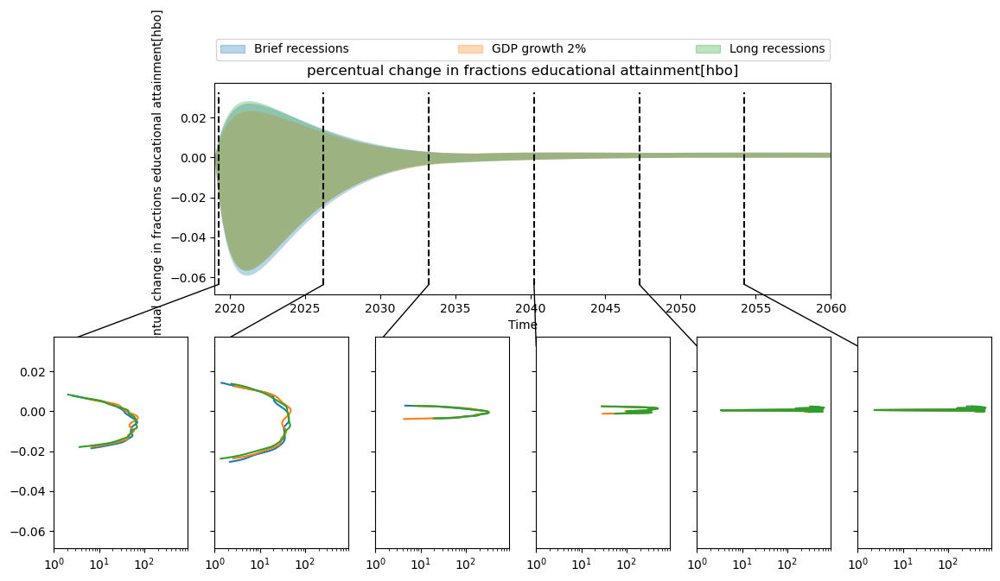

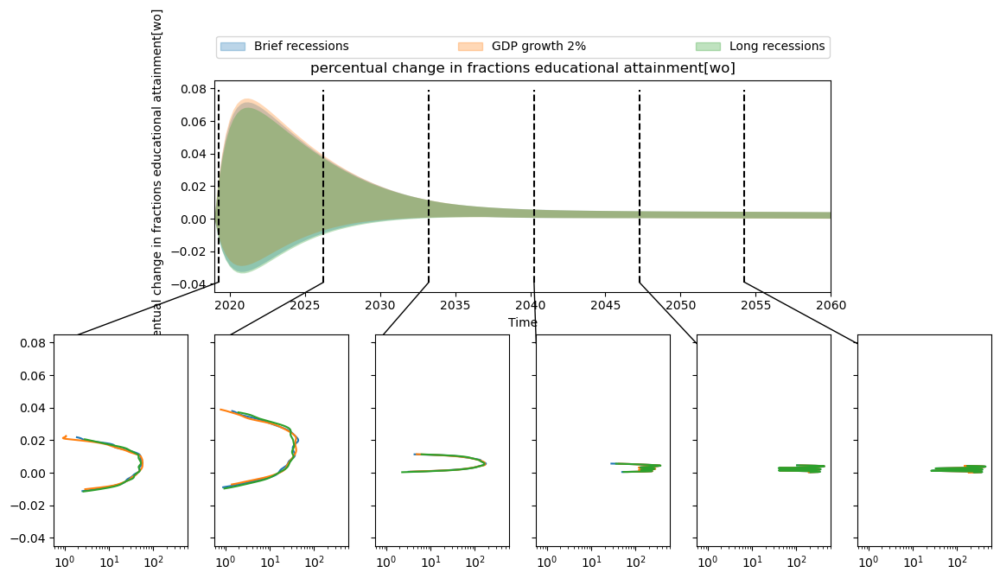

In [115]:
for outcome in outcomes.keys():
    if outcome == 'TIME':
        continue

    # pick points in time for which we want to see a9# density subplot
    time = outcomes["TIME"][0, :]
    times = time[1 :: math.ceil(time.shape[0] / 6)].tolist()


    multiple_densities(
        experiments,
        outcomes ,outcomes_to_show=[outcome],
        log=True,
        points_in_time=times,
        group_by= "SWITCH GDP growth scenario", 
               grouping_specifiers = {'GDP growth 2%': 0, 'Brief recessions' : 1, 'Long recessions' : 2},
        density=Density.KDE,
        fill=True,
    )

    fig = plt.gcf()
    fig.set_size_inches(14, 7)

    plt.show()



# Pairsplotting

In [137]:
#This piece will create a new outcome dataframe for certain outcomes of interest
outcomes_of_interest = ('unemployment rate', 'net FTE scarcity', 'FTE scarcity for low edu' , 'FTE scarcity for mid edu' , 
                        'FTE scarcity for high edu')
new = dict((k, outcomes[k]) for k in outcomes_of_interest)

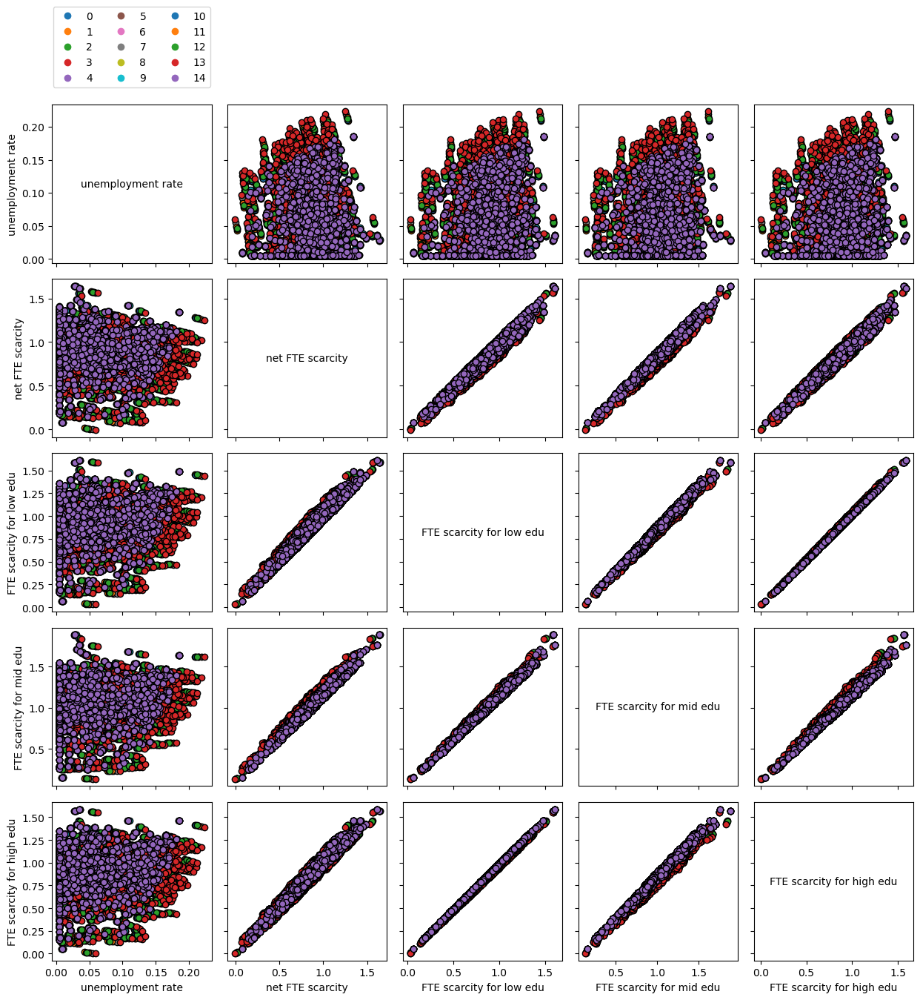

In [138]:
fig, axes = pairs_plotting.pairs_scatter(experiments, new, group_by="policy", legend=True)
fig.set_size_inches(15,15)
plt.show()

# Advanced PRIM | Net FTE scarcity

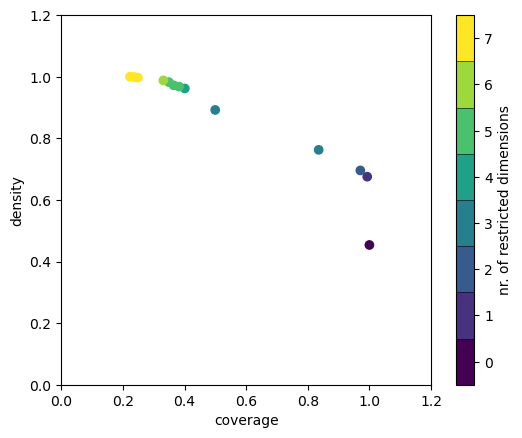

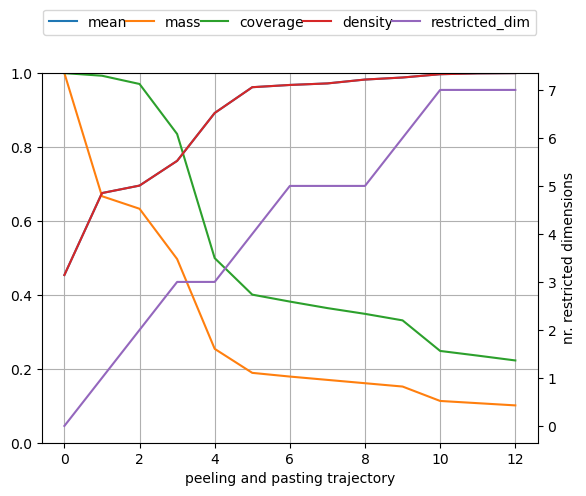

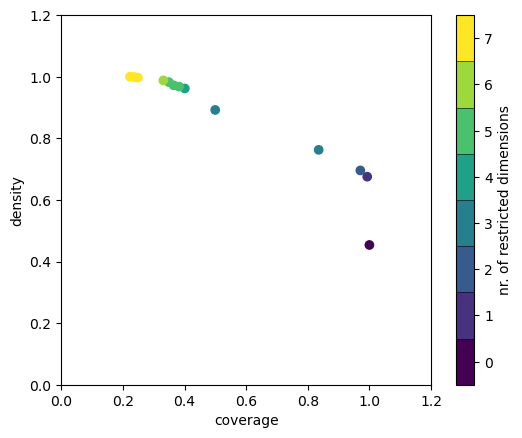

In [160]:
def classify(outcomes):
    # get the output for net FTE scarcity
    ooi = outcomes["net FTE scarcity"]
    return ooi[:, -1] > 0.9

# perform prim on modified results tuple
prim_obj = prim.setup_prim(results, classify, threshold=0.8, threshold_type=1)

box_1 = prim_obj.find_box()
box_1.show_ppt()
box_1.show_tradeoff()


coverage    0.499412
density     0.892126
id          4.000000
mass        0.254000
mean        0.892126
res_dim     3.000000
Name: 4, dtype: float64

                                    box 4                                  
                                      min       max      qp value  qp value
labour productivity coefficient -0.499157  1.393917           NaN  0.513136
SWITCH GDP growth scenario            {0}       {0}  0.000000e+00       NaN
labour_coeff_cat                   {0, 1}    {0, 1}  1.062799e-19       NaN

    coverage   density  id   mass      mean  res_dim
0   1.000000  0.453733   0  1.000  0.453733        0
1   0.992947  0.675462   1  0.667  0.675462        1
2   0.970614  0.695735   2  0.633  0.695735        2
3   0.835292  0.762575   3  0.497  0.762575        3
4   0.499412  0.892126   4  0.254  0.892126        3
5   0.400676  0.961905   5  0.189  0.961905        4
6   0.381869  0.967970   6  0.179  0.967970        5
7   0.364237  0.972157   7  0.170  0.972157 

/Users/Lucas/opt/anaconda3/lib/python3.9/site-packages/ema_workbench/analysis/scenario_discovery_util.py:419: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


       coverage   density   mass  res_dim
box 1  0.499412  0.892126  0.254        3
                                    box 1          
                                      min       max
SWITCH GDP growth scenario            {0}       {0}
labour_coeff_cat                   {0, 1}    {0, 1}
labour productivity coefficient -0.499157  1.393917


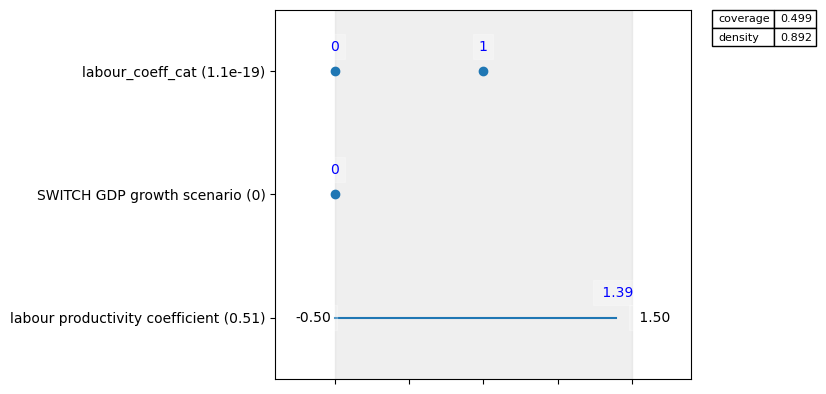

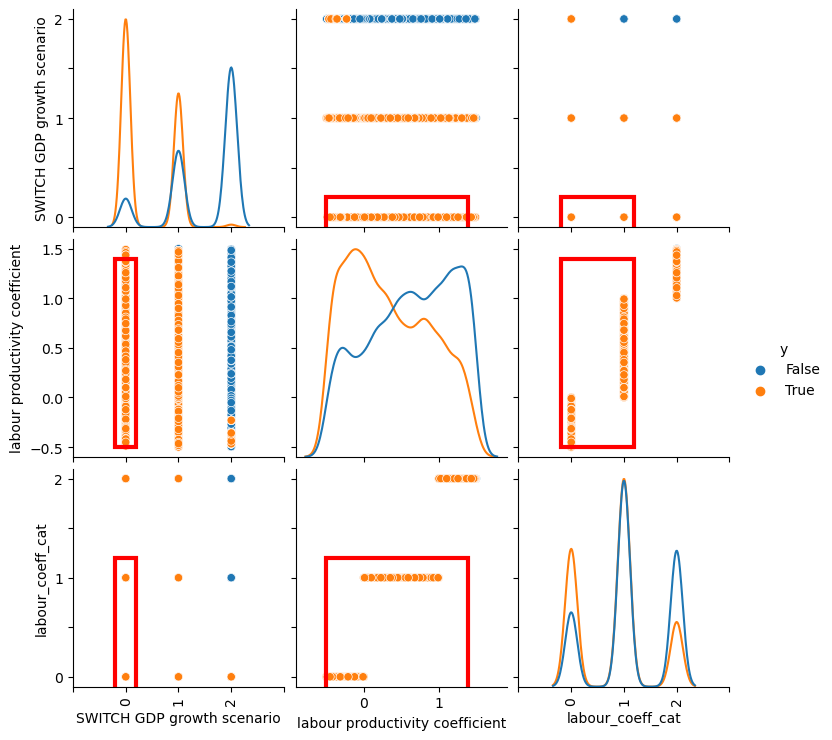

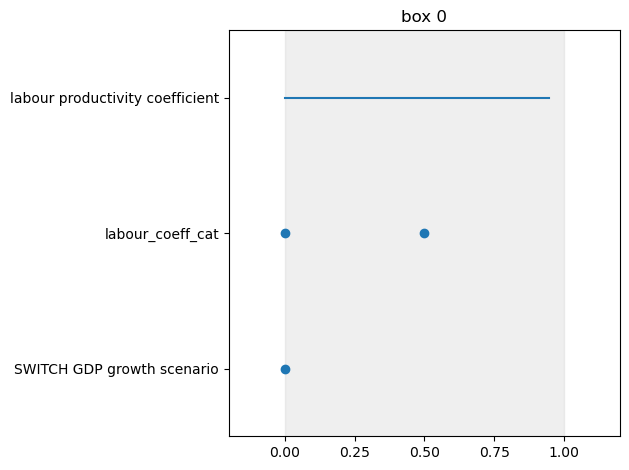

In [161]:
#Define point of interest based on above graph
poi = 4
box_1.inspect(poi, style="graph", boxlim_formatter="{: .2f}")
box_1.inspect(poi)
box_1.select(poi)
box_1.write_ppt_to_stdout()
box_1.show_pairs_scatter(poi)

# print prim to std_out
print(prim_obj.stats_to_dataframe())
print(prim_obj.boxes_to_dataframe())

# visualize
prim_obj.show_boxes()
plt.show()

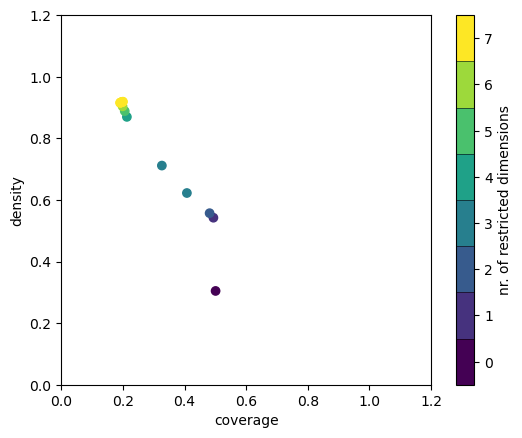

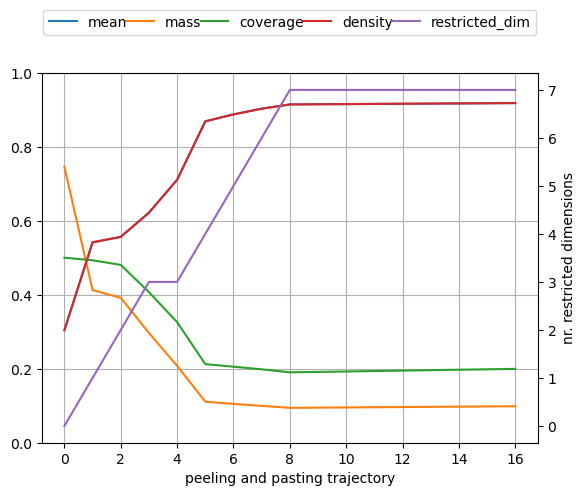

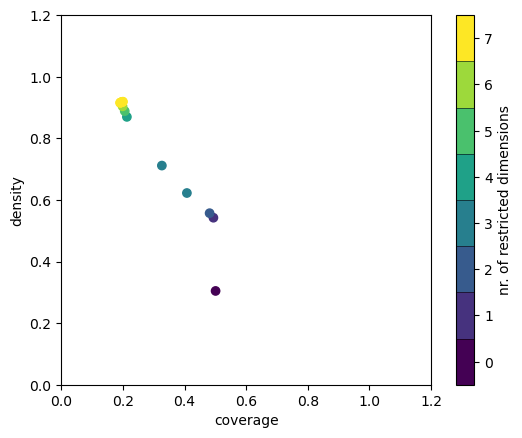

In [162]:
# The found box only explains 63% of cases. Continue searching
# perform prim on modified results tuple

box_2 = prim_obj.find_box()
box_2.show_ppt()
box_2.show_tradeoff()


coverage    0.212607
density     0.869591
id          5.000000
mass        0.110933
mean        0.869591
res_dim     4.000000
Name: 5, dtype: float64

                                              box 5                           \
                                                min       max       qp value   
labour productivity coefficient           -0.499157  1.435536            NaN   
SWITCH GDP growth scenario                   {0, 1}    {0, 1}  1.095448e-223   
SWITCH technological development scenario    {0, 2}    {0, 2}   2.756448e-78   
SWITCH increase FTE per worker                  {0}       {0}   2.642593e-53   

                                                     
                                           qp value  
labour productivity coefficient            0.090066  
SWITCH GDP growth scenario                      NaN  
SWITCH technological development scenario       NaN  
SWITCH increase FTE per worker                  NaN  

    coverage   density  id      mass      m

/Users/Lucas/opt/anaconda3/lib/python3.9/site-packages/ema_workbench/analysis/scenario_discovery_util.py:419: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


       coverage   density      mass  res_dim
box 1  0.499412  0.892126  0.254000        3
box 2  0.212607  0.869591  0.110933        4
                                                  box 1                \
                                                    min           max   
SWITCH GDP growth scenario                          {0}           {0}   
labour_coeff_cat                                 {0, 1}        {0, 1}   
labour productivity coefficient               -0.499157      1.393917   
SWITCH increase FTE per worker                   {0, 1}        {0, 1}   
SWITCH technological development scenario  {0, 1, 2, 3}  {0, 1, 2, 3}   

                                               box 2             
                                                 min        max  
SWITCH GDP growth scenario                    {0, 1}     {0, 1}  
labour_coeff_cat                           {0, 1, 2}  {0, 1, 2}  
labour productivity coefficient            -0.499157   1.435536  
SWITCH increase FTE per

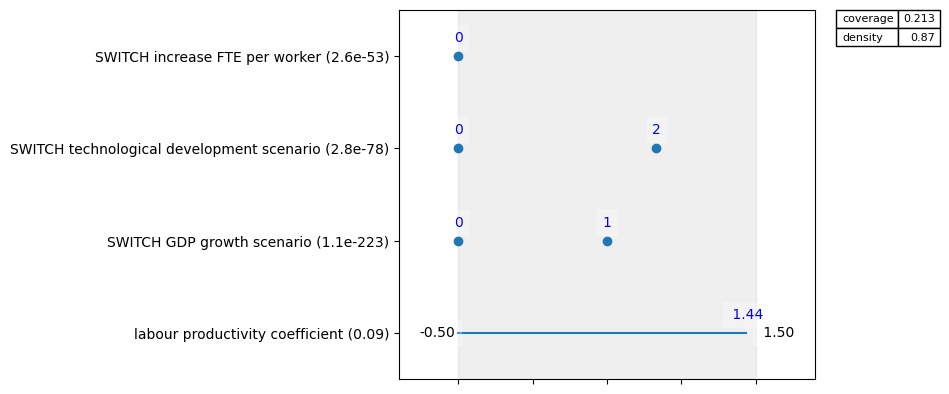

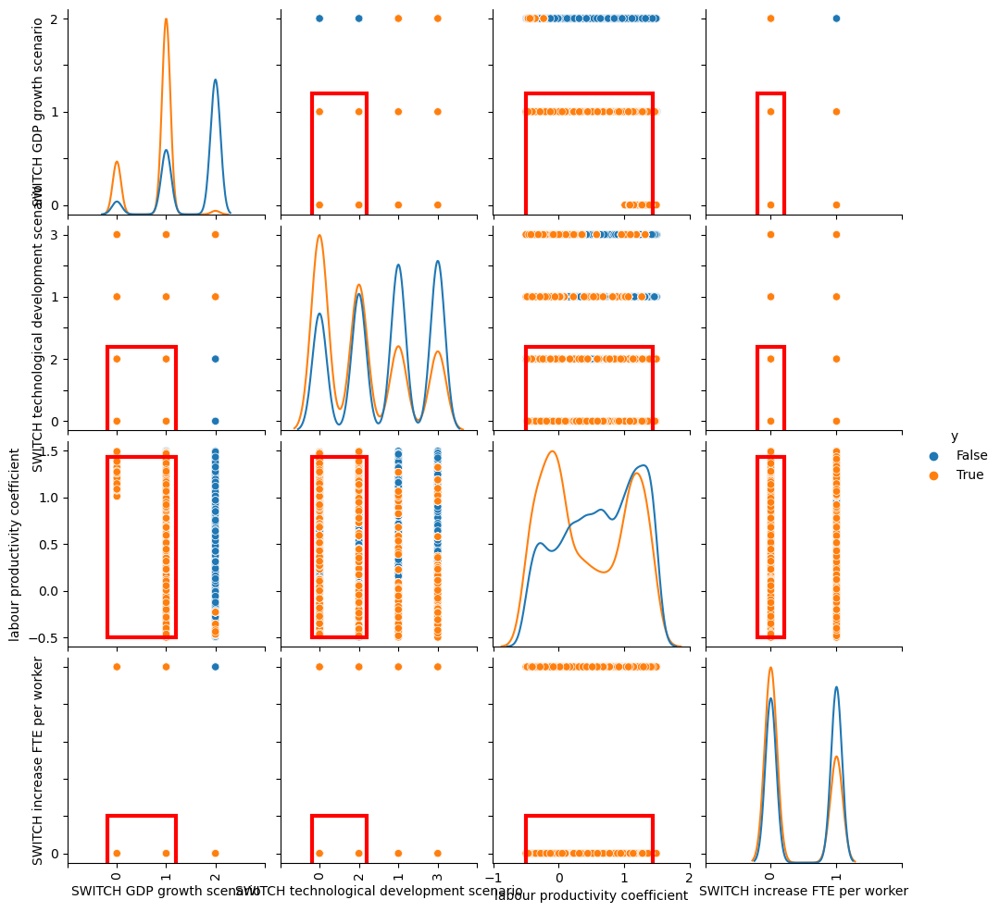

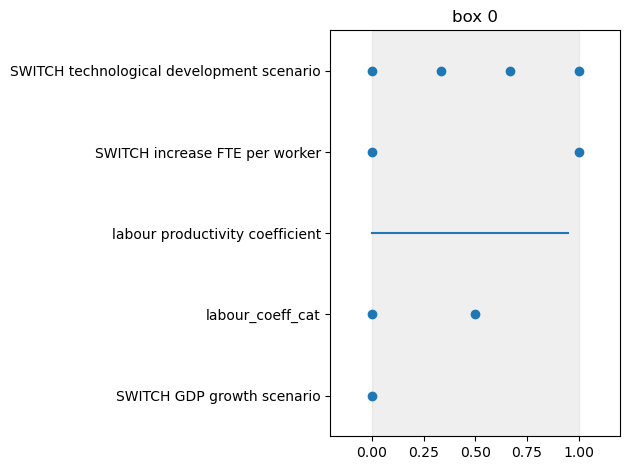

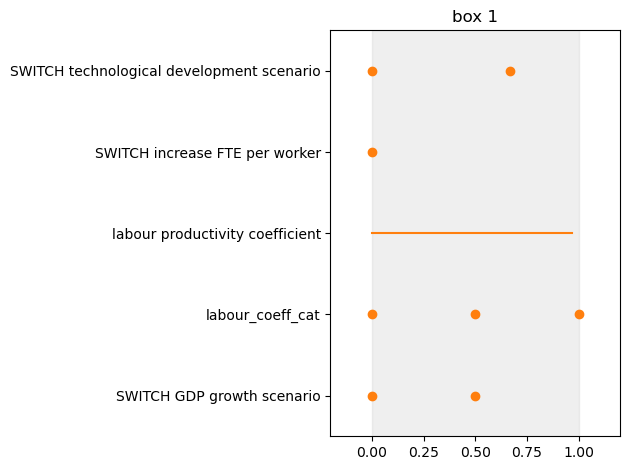

In [163]:
#Define point of interest based on above graph
poi = 5
box_2.inspect(poi, style="graph", boxlim_formatter="{: .2f}")
box_2.inspect(poi)
box_2.select(poi)
box_2.write_ppt_to_stdout()
box_2.show_pairs_scatter(poi)

# print prim to std_out
print(prim_obj.stats_to_dataframe())
print(prim_obj.boxes_to_dataframe())

# visualize
prim_obj.show_boxes()
plt.show()

# Advanced PRIM | unemployment rate

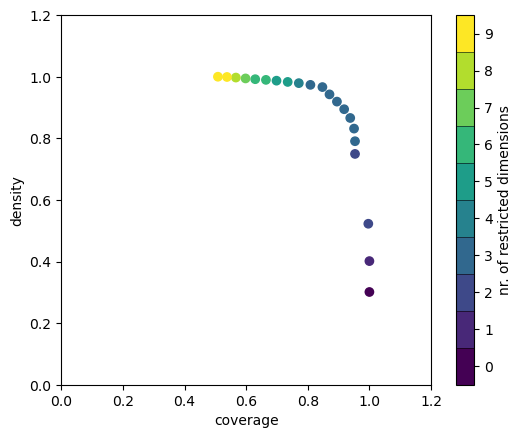

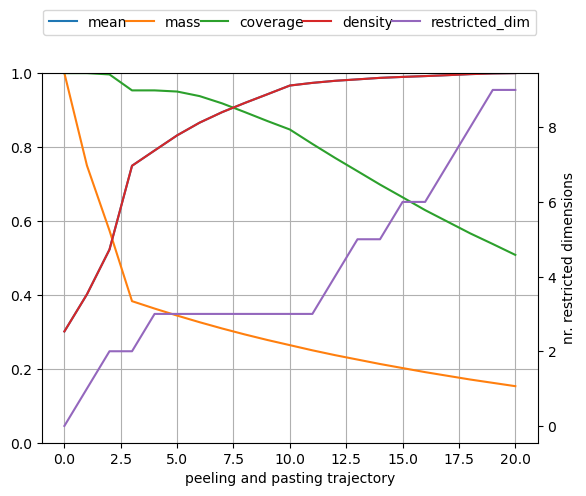

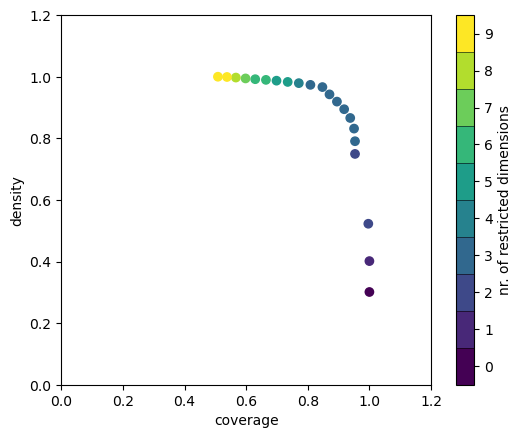

In [164]:
def classify(outcomes):
    # get the output for net FTE scarcity
    ooi = outcomes["unemployment rate"]
    return ooi[:, -1] > 0.1

# perform prim on modified results tuple
prim_obj_unemp = prim.setup_prim(results, classify, threshold=0.8, threshold_type=1)

box_1_unemp = prim_obj_unemp.find_box()
box_1_unemp.show_ppt()
box_1_unemp.show_tradeoff()


coverage    0.950177
density     0.831589
id          5.000000
mass        0.344000
mean        0.831589
res_dim     3.000000
Name: 5, dtype: float64

                                box 5                                 
                                  min       max      qp value qp value
SWITCH immigration scenarios   {2, 3}    {2, 3}  0.000000e+00      NaN
hiring time                   2.32487  4.998267  3.878611e-46      NaN
hiring_cat                     {1, 2}    {1, 2}  5.090592e-01      NaN

    coverage   density  id   mass      mean  res_dim
0   1.000000  0.301067   0  1.000  0.301067        0
1   1.000000  0.401422   1  0.750  0.401422        1
2   0.996457  0.522648   2  0.574  0.522648        2
3   0.953277  0.749347   3  0.383  0.749347        2
4   0.953277  0.790634   4  0.363  0.790634        3
5   0.950177  0.831589   5  0.344  0.831589        3
6   0.937777  0.866053   6  0.326  0.866053        3
7   0.918069  0.894498   7  0.309  0.894498        3
8   0.894597  0.

/Users/Lucas/opt/anaconda3/lib/python3.9/site-packages/ema_workbench/analysis/scenario_discovery_util.py:419: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


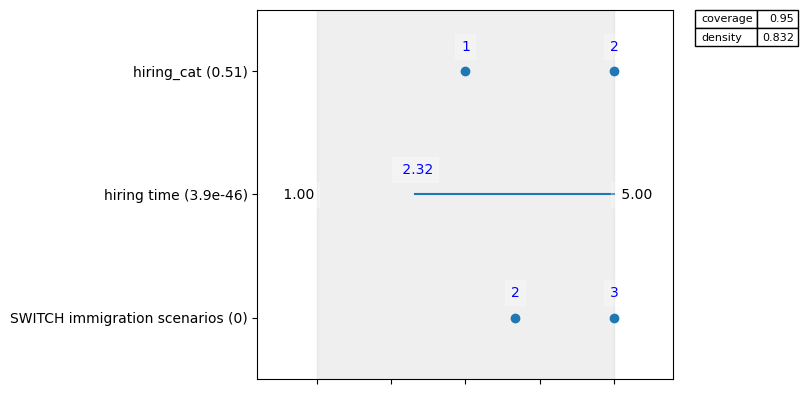

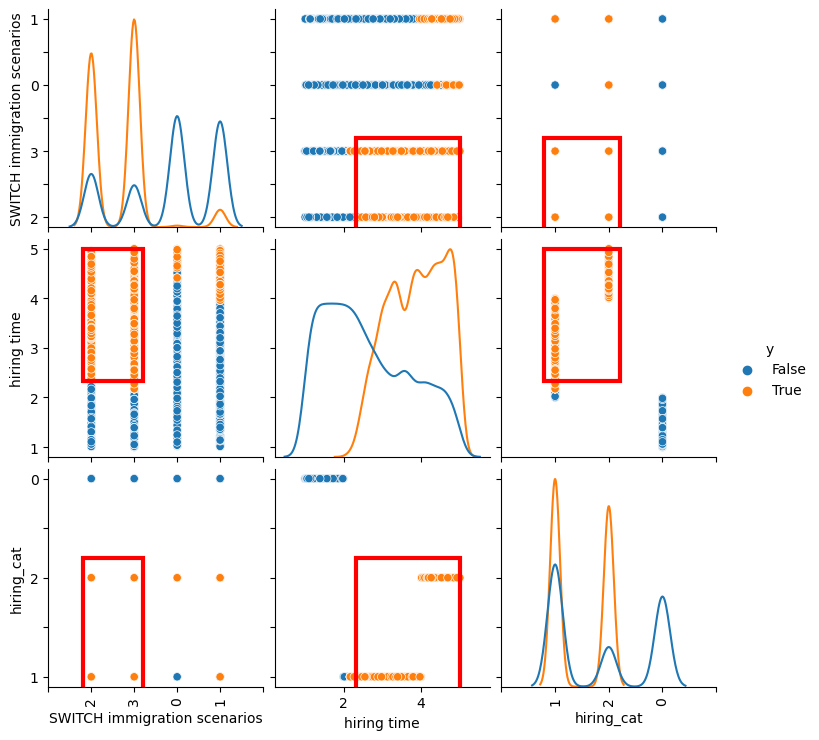

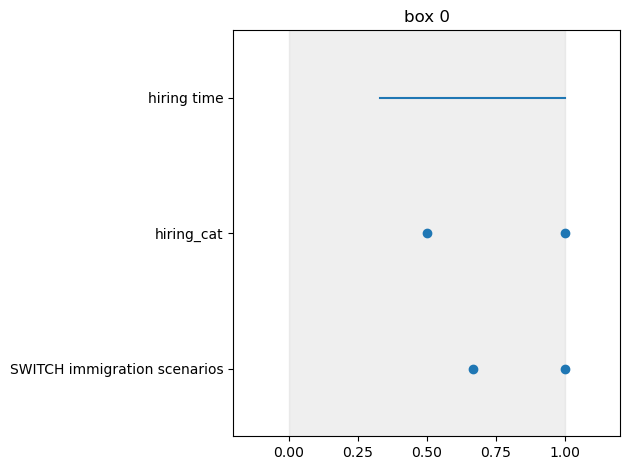

In [165]:
#Define point of interest based on above graph
poi = 5
box_1_unemp.inspect(poi, style="graph", boxlim_formatter="{: .2f}")
box_1_unemp.inspect(poi)
box_1_unemp.select(poi)
box_1_unemp.write_ppt_to_stdout()
box_1_unemp.show_pairs_scatter(poi)

# print prim to std_out
print(prim_obj_unemp.stats_to_dataframe())
print(prim_obj_unemp.boxes_to_dataframe())

# visualize
prim_obj_unemp.show_boxes()
plt.show()

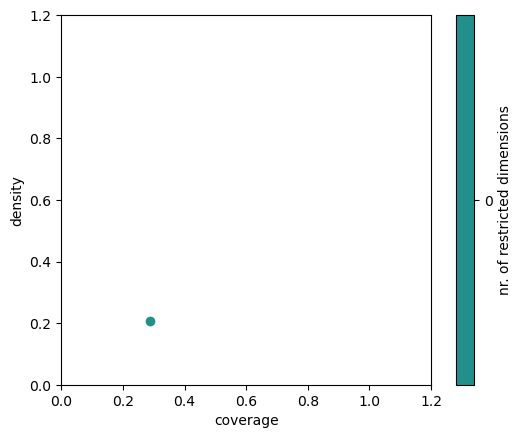

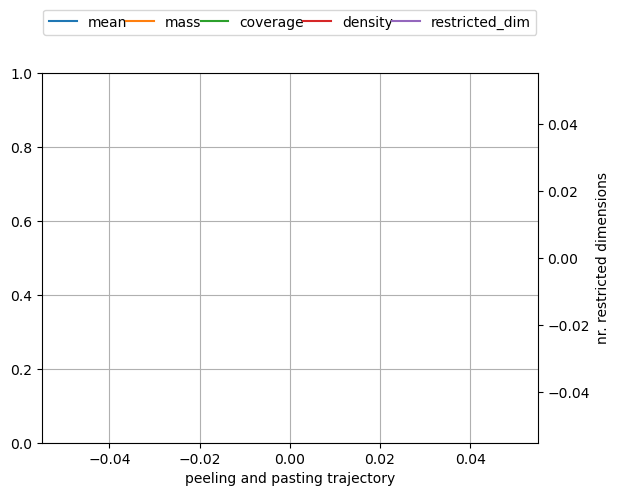

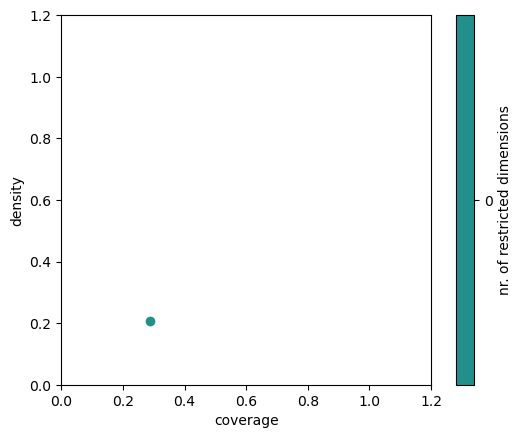

In [166]:
# The found box explains 95% of cases. Continue searching
# perform prim on modified results tuple

box_2_unemp = prim_obj.find_box()
box_2_unemp.show_ppt()
box_2_unemp.show_tradeoff()

# Basic PRIM | Net FTE scarcity

In [15]:
x = experiments
y = outcomes["net FTE scarcity"][:, -1] > 0.5
prim_alg = prim.Prim(x, y, threshold = 0.8, peel_alpha = 0.1)
box1 = prim_alg.find_box()


C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scen

C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scen

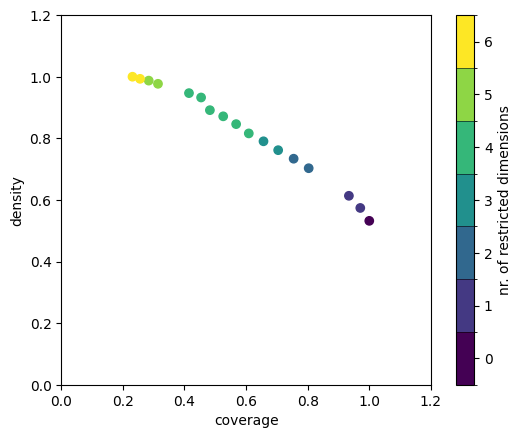

In [56]:
#Aim for at least 80% density, this way at least 80% of all the points that are within the box are of interest. Going to a lower density below 0.5 
# it is no better than a coin toss
box1.show_tradeoff()
plt.show()

coverage    0.608821
density     0.815953
id          7.000000
mass        0.397000
mean        0.815953
res_dim     4.000000
Name: 7, dtype: float64

                                                        box 7             \
                                                          min        max   
elasticity of industries to economic change          0.010597   0.882554   
substitutability of human capital due to techno...  -0.199702   0.170333   
hiring time                                          2.351576   4.996473   
SWITCH GDP growth scenario                          {0, 1, 2}  {0, 1, 2}   

                                                                   \
                                                         qp value   
elasticity of industries to economic change                   NaN   
substitutability of human capital due to techno...            NaN   
hiring time                                         1.919252e-150   
SWITCH GDP growth scenario                     

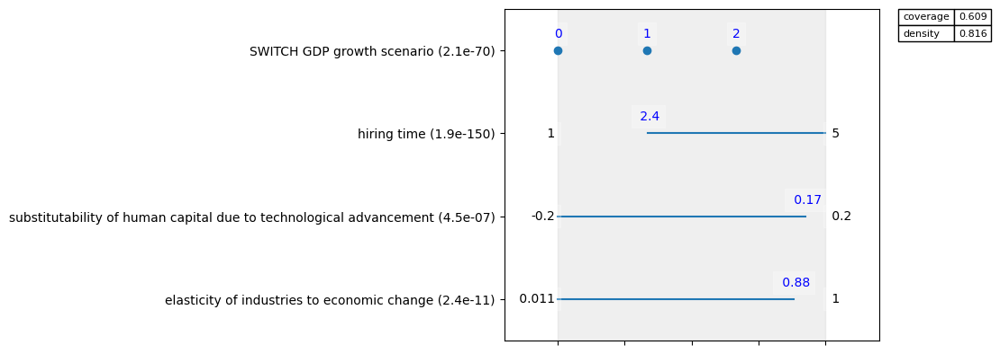

In [64]:
#In the plots --> each row is an uncertain factor. The qp-values are given in between parentheses. If they are above 0.05 
# the particular rule set may not be of interest in interpreting these results
box = 7
box1.inspect(box)
box1.inspect(box, style='graph')
plt.show()

C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:419: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


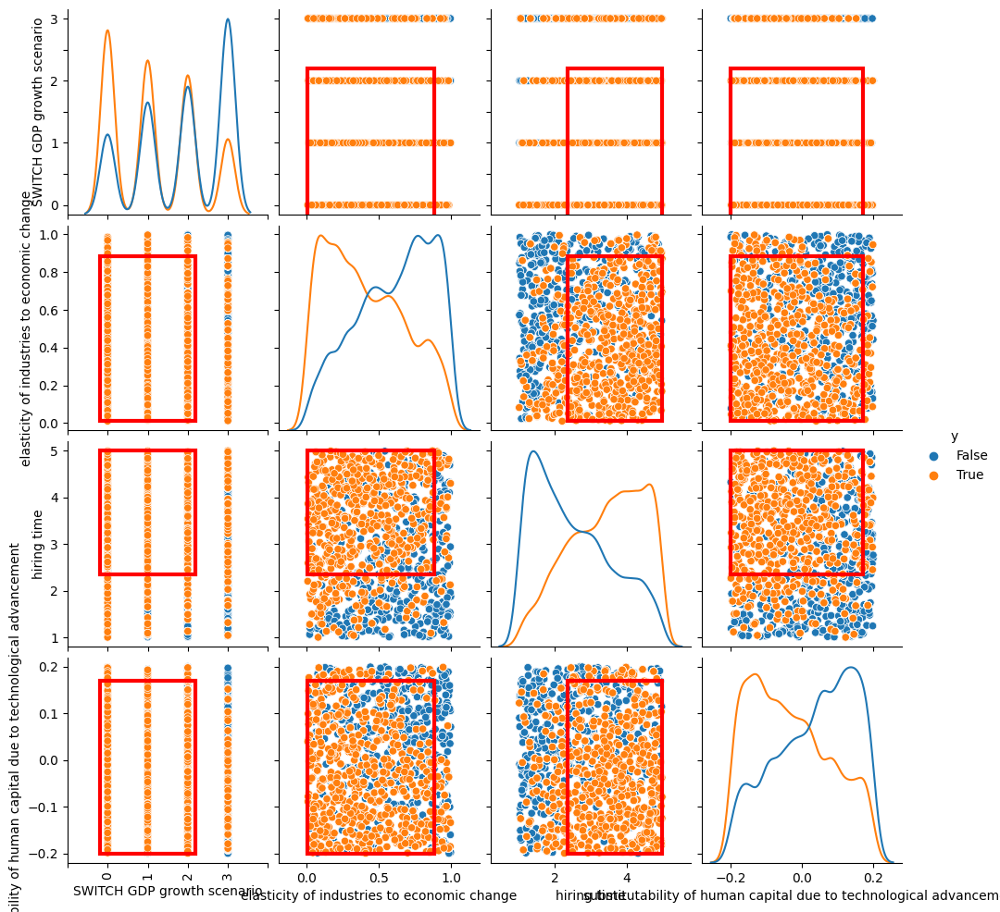

In [65]:
box1.show_pairs_scatter(box)
plt.show()

### The first box has a density of 81%. Search for second box

In [67]:
box2 = prim_alg.find_box()

C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scen

C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scen

C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:233: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for column, values in x.select_dtypes(exclude=np.number).iteritems():
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\ema_workbench\analysis\scen

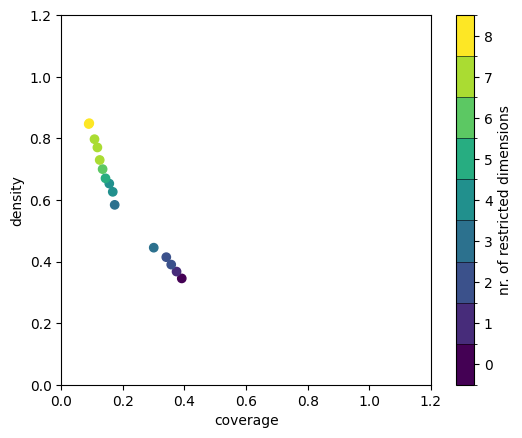

In [69]:
#Aim for at least 80% density, this way at least 80% of all the points that are within the box are of interest. Going to a lower density below 0.5 
# it is no better than a coin toss
box2.show_tradeoff()
plt.show()

# Regional Sensitivity Analysis

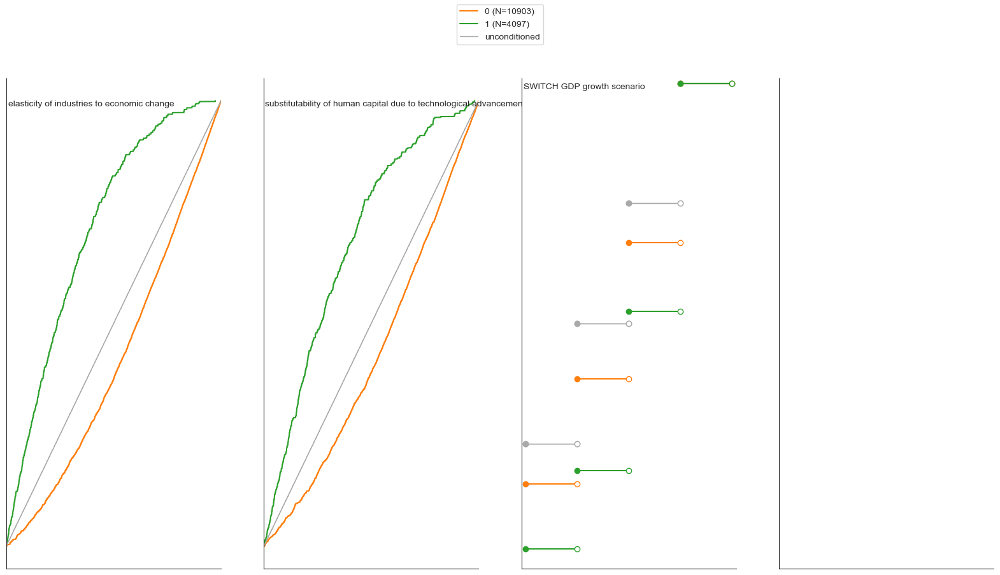

In [56]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style("white")

# model is the same across experiments
x = experiments.copy()
# x = x.drop(["model", 'SWITCH GDP growth scenario'], axis=1)
x = x[['elasticity of industries to economic change', 'substitutability of human capital due to technological advancement', 
      'SWITCH GDP growth scenario' ]]
y = outcomes["net FTE scarcity"][:,-1] > 1
fig = regional_sa.plot_cdfs(x, y)
sns.despine()
plt.gcf().set_size_inches(20, 10)
plt.show()

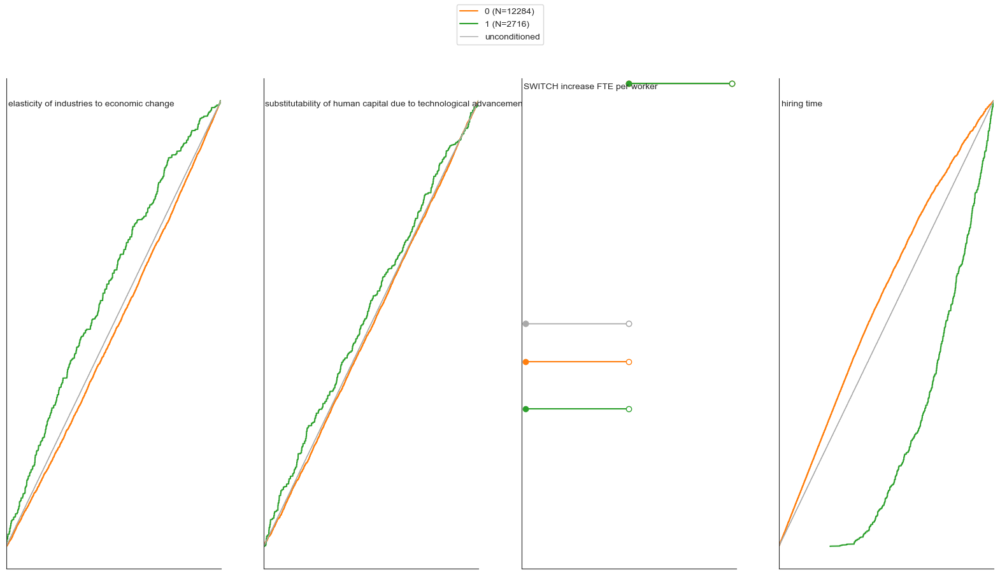

In [58]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style("white")

# model is the same across experiments
x = experiments.copy()
# x = x.drop(["model", 'SWITCH GDP growth scenario'], axis=1)
x = x[['elasticity of industries to economic change', 'substitutability of human capital due to technological advancement', 
      'SWITCH increase FTE per worker', 'hiring time' ]]
y = outcomes["unemployment rate"][:,-1] > 0.1
fig = regional_sa.plot_cdfs(x, y)
sns.despine()
plt.gcf().set_size_inches(20, 10)
plt.show()

# CART 


        coverage   density  res dim   mass
box 1   0.269465  0.994595        3  0.074
box 2   0.206004  0.937778        3  0.060
box 3   0.606297  0.867016        3  0.191
box 4   0.350500  0.797778        3  0.120
box 5   0.045643  0.346296        3  0.036
box 6   0.014645  0.114286        3  0.035
box 7   0.005614  0.045098        3  0.034
box 8   0.072004  0.378205        3  0.052
box 9   0.003661  0.027027        3  0.037
box 10  0.075665  0.232210        3  0.089
box 11  0.001953  0.017204        3  0.031
box 12  0.000000  0.000000        3  0.029
box 13  0.000000  0.000000        3  0.126
                                                       box 1            \
                                                         min       max   
elasticity of industries to economic change         0.010925  0.252479   
SWITCH GDP growth scenario                            {0, 1}    {0, 1}   
substitutability of human capital due to techno... -0.199686  0.031629   

                           

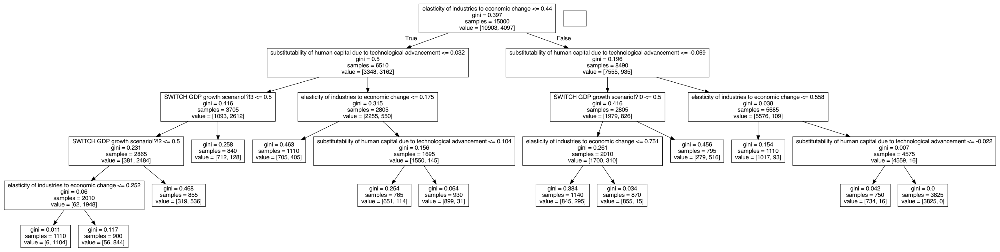

In [62]:
from matplotlib.pyplot import figure
x, outcomes = results

ooi = outcomes["net FTE scarcity"]
y =  ooi[:, -1] > 1

cart_alg = cart.CART(x, y)
cart_alg.build_tree()

# print cart to std_out
print(cart_alg.stats_to_dataframe())
print(cart_alg.boxes_to_dataframe())

# visualize
cart_alg.show_tree()
plt.gcf().set_size_inches(50, 25)
plt.show()

       coverage   density  res dim      mass
box 1  0.000000  0.000000        2  0.266667
box 2  0.000000  0.000000        3  0.089067
box 3  0.000000  0.000000        3  0.077333
box 4  0.003682  0.007225        3  0.092267
box 5  0.079529  0.101887        3  0.141333
box 6  0.000000  0.000000        3  0.172267
box 7  0.083211  0.066159        3  0.227733
box 8  0.083211  0.066159        3  0.227733
                                   box 1                box 2             \
                                     min       max        min        max   
SWITCH immigration scenarios      {0, 1}    {0, 1}  {0, 1, 2}  {0, 1, 2}   
SWITCH increase FTE per worker       {0}    {0, 1}        {0}     {0, 1}   
hiring time                     1.001438  4.998852   1.001438   1.890057   

                                    box 3                 box 4             \
                                      min        max        min        max   
SWITCH immigration scenarios    {0, 1, 2}  {0, 1, 2}  {0, 

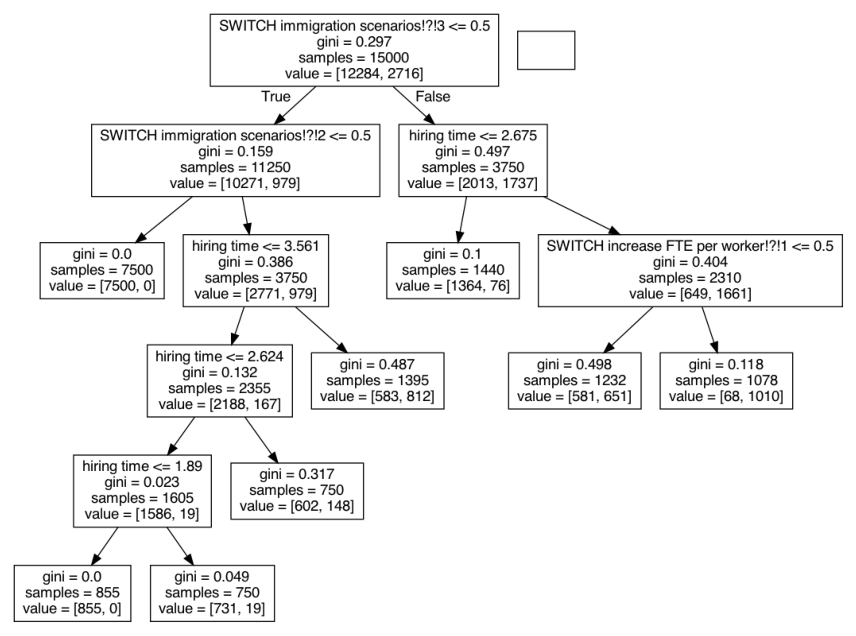

In [25]:
from matplotlib.pyplot import figure
x, outcomes = results

ooi = outcomes["unemployment rate"]
y =  ooi[:, -1] > 0.1

cart_alg = cart.CART(x, y)
cart_alg.build_tree()

# print cart to std_out
print(cart_alg.stats_to_dataframe())
print(cart_alg.boxes_to_dataframe())

# visualize
cart_alg.show_tree()
plt.gcf().set_size_inches(35, 8)
plt.show()

# SOBOL

In [49]:
from SALib.analyze import sobol
from ema_workbench import Samplers
from ema_workbench.em_framework.salib_samplers import get_SALib_problem

with MultiprocessingEvaluator(model) as evaluator:
    sa_results = evaluator.perform_experiments(scenarios=10, uncertainty_sampling=Samplers.SOBOL)

experiments_sa, outcomes_sa = sa_results


[MainProcess/INFO] pool started with 4 workers
C:\Users\Lucas\AppData\Local\Programs\Python\Python310\lib\site-packages\SALib\sample\saltelli.py:109: UserWarning: 
        Convergence properties of the Sobol' sequence is only valid if
        `N` (10) is equal to `2^n`.
        
  warnings.warn(msg)
[MainProcess/INFO] performing 360 scenarios * 1 policies * 1 model(s) = 360 experiments
100%|██████████████████████████████████████| 360/360 [1:13:19<00:00, 12.22s/it]
[MainProcess/INFO] experiments finished
[MainProcess/INFO] terminating pool


ValueError: could not broadcast input array from shape (3,657) into shape (1825,)

In [70]:
outcomes_sa

{'TIME': array([[2019.    , 2019.0625, 2019.125 , ..., 2059.875 , 2059.9375,
         2060.    ],
        [2019.    , 2019.0625, 2019.125 , ..., 2059.875 , 2059.9375,
         2060.    ],
        [2019.    , 2019.0625, 2019.125 , ..., 2059.875 , 2059.9375,
         2060.    ],
        ...,
        [2019.    , 2019.0625, 2019.125 , ..., 2059.875 , 2059.9375,
         2060.    ],
        [2019.    , 2019.0625, 2019.125 , ..., 2059.875 , 2059.9375,
         2060.    ],
        [2019.    , 2019.0625, 2019.125 , ..., 2059.875 , 2059.9375,
         2060.    ]], dtype=float32),
 'unemployment rate': array([[0.0570358 , 0.05690823, 0.05678101, ..., 0.04343507, 0.04342354,
         0.04341199],
        [0.0570358 , 0.05690823, 0.05678101, ..., 0.04389555, 0.04388585,
         0.0438761 ],
        [0.0570358 , 0.05690738, 0.05677933, ..., 0.05324017, 0.05325225,
         0.05326427],
        ...,
        [0.0570358 , 0.05690686, 0.05677829, ..., 0.0336428 , 0.03357584,
         0.03350857],
    

In [71]:
problem = get_SALib_problem(model.uncertainties)
Si = sobol.analyze(problem, outcomes_sa["total FTE's demanded"][:, 1], calc_second_order=True, print_to_console=False)

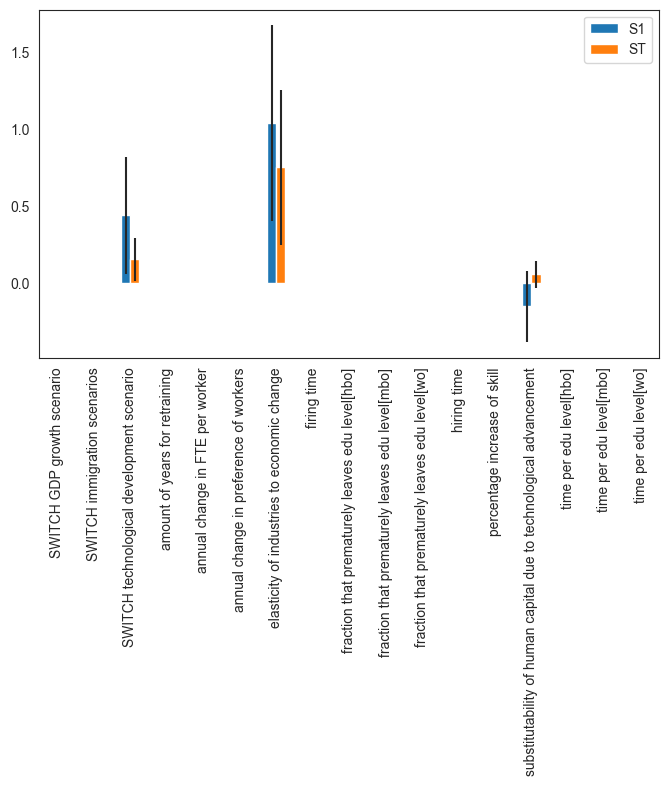

In [72]:
scores_filtered = {k: Si[k] for k in ["ST", "ST_conf", "S1", "S1_conf"]}
Si_df = pd.DataFrame(scores_filtered, index=problem["names"])

sns.set_style("white")
fig, ax = plt.subplots(1)

indices = Si_df[["S1", "ST"]]
err = Si_df[["S1_conf", "ST_conf"]]

indices.plot.bar(yerr=err.values.T, ax=ax)
fig.set_size_inches(8, 6)
fig.subplots_adjust(bottom=0.3)
plt.show()